
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1274438114.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1274438114.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1274438114.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 19:39:33 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>


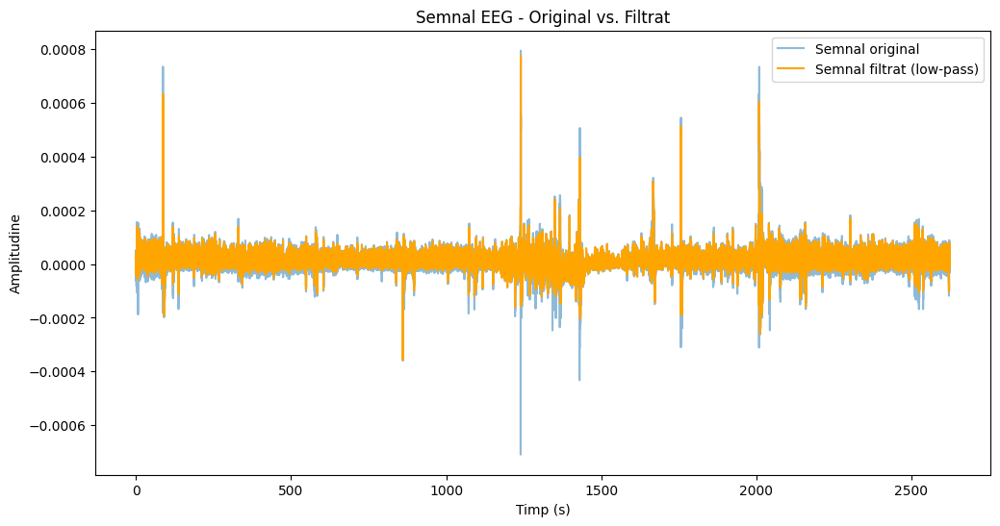

In [4]:
# Instalam bibliotecile necesare
!pip install mne

import mne
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# 1. Incarcare fisier EDF
def load_eeg_data(file_path):
    # Se citesc datele EDF
    raw = mne.io.read_raw_edf(file_path, preload=True)
    print(raw.info)  # Afisam informatiile despre fisier
    return raw

# 2. Filtrare - Low-pass filter
def low_pass_filter(data, cutoff, sfreq, order=4):
    nyquist = 0.5 * sfreq
    normal_cutoff = cutoff / nyquist
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    return signal.filtfilt(b, a, data)

file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-1.edf"  
raw = load_eeg_data(file_path)

# 3. Selectam un canal EEG pentru exemplu
eeg_channel = raw.get_data(picks="Fp1")[0]  
sfreq = raw.info['sfreq']  # Frecventa de eșantionare

# 4. Aplicare filtrul low-pass
cutoff = 40  # Frecventa de taiere
filtered_signal = low_pass_filter(eeg_channel, cutoff, sfreq)

# 5. Vizualizare semnal original si filtrat
time = np.linspace(0, len(eeg_channel) / sfreq, len(eeg_channel))
plt.figure(figsize=(12, 6))
plt.plot(time, eeg_channel, label='Semnal original', alpha=0.5)
plt.plot(time, filtered_signal, label='Semnal filtrat (low-pass)', color='orange')
plt.title("Semnal EEG - Original vs. Filtrat")
plt.xlabel("Timp (s)")
plt.ylabel("Amplitudine")
plt.legend()
plt.show()


In [3]:
print(raw.info['ch_names'])

['EEG Fp1', 'EEG F3', 'EEG C3', 'EEG P3', 'EEG O1', 'EEG F7', 'EEG T3', 'EEG T5', 'EEG Fc1', 'EEG Fc5', 'EEG Cp1', 'EEG Cp5', 'EEG F9', 'EEG Fz', 'EEG Cz', 'EEG Pz', 'EEG Fp2', 'EEG F4', 'EEG C4', 'EEG P4', 'EEG O2', 'EEG F8', 'EEG T4', 'EEG T6', 'EEG Fc2', 'EEG Fc6', 'EEG Cp2', 'EEG Cp6', 'EEG F10', 'EKG EKG', 'SPO2', 'HR', '1', '2', 'MK']


In [5]:
import mne
import pandas as pd
import numpy as np

# Functia pentru a incarca datele EEG
def load_eeg_data(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)
    print(raw.info)  
    return raw

# Incarcare fisiere EEG pentru PN00-1 pana la PN00-5
file_paths = [
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-1.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-2.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-3.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-4.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-5.edf"
]

# Incarcam toate fisierele de date EEG
raws = [load_eeg_data(file_path) for file_path in file_paths]


Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 19:39:33 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 02:18:17 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1284607  =      0.000 ...  2508.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 18:15:44 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1076223  =      0.000 ...  2101.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 20:51:43 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1097215  =      0.000 ...  2142.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_28992\1892924502.py:7: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 22:22:04 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>


Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...
<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 19:39:33 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...
<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T

C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


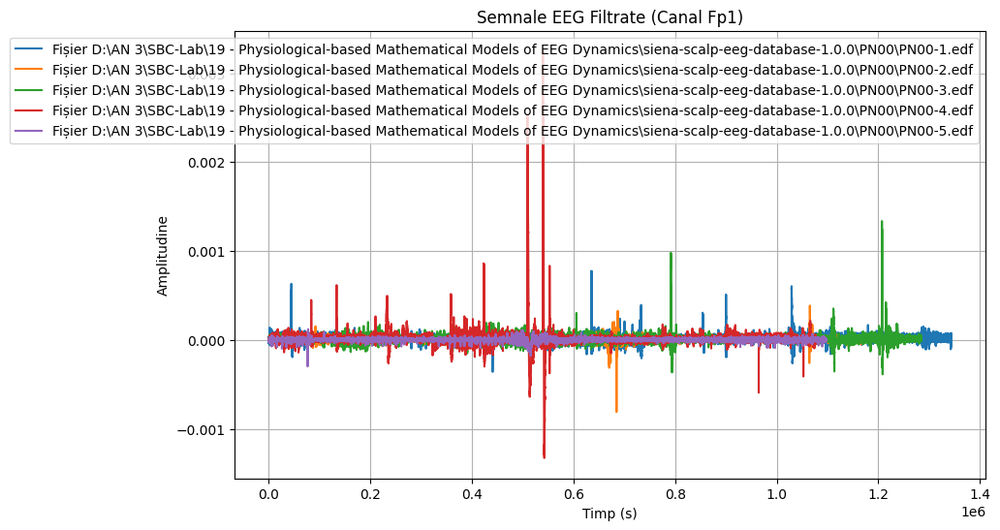

In [25]:
import warnings
warnings.filterwarnings('ignore', category=RuntimeWarning)

import mne
import pandas as pd
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Functia pentru a incarca datele EEG
def load_eeg_data(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)
    print(raw.info)  
    return raw

# Functia de filtrare low-pass
def low_pass_filter(data, cutoff, sfreq, order=4):
    nyquist = 0.5 * sfreq
    normal_cutoff = cutoff / nyquist
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    return signal.filtfilt(b, a, data)

# Incarcare fisiere EEG pentru PN00-1 pana la PN00-5
file_paths = [
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-1.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-2.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-3.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-4.edf",
    "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-5.edf"
]


raws = [load_eeg_data(file_path) for file_path in file_paths]

# Aplicare filtru low-pass pentru toate fisierele
cutoff = 40  # Frecventa de taiere
filtered_signals = []

plt.figure(figsize=(10, 6))

for i, raw in enumerate(raws):
    eeg_channel = raw.get_data(picks="EEG Fp1")[0]  # Alegem canalul Fp1
    sfreq = raw.info['sfreq']  # Frecventa de esantionare
    filtered_signal = low_pass_filter(eeg_channel, cutoff, sfreq)
    filtered_signals.append(filtered_signal)

    # Plotare semnal filtrat pentru fiecare fisier
    plt.plot(filtered_signal, label=f'Fișier {file_paths[i]}')


plt.title('Semnale EEG Filtrate (Canal Fp1)')
plt.xlabel('Timp (s)')
plt.ylabel('Amplitudine')
plt.legend()
plt.grid(True)

# Afisare grafic
plt.show()


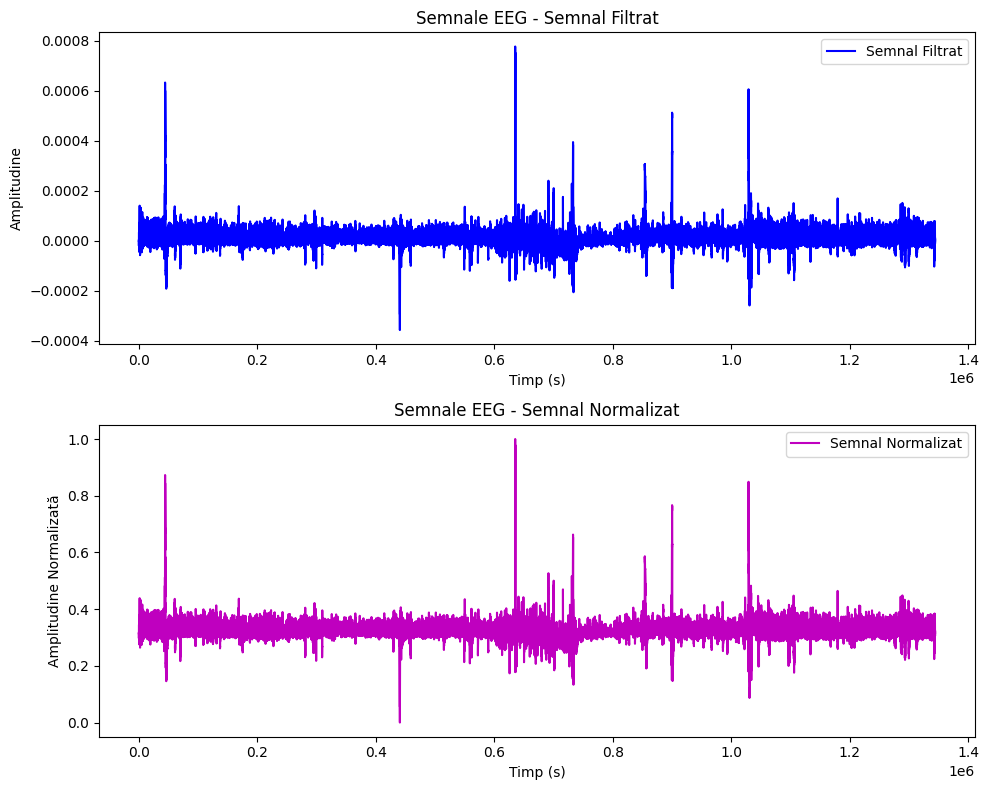

In [30]:
# Functia de normalizare a datelor
def normalize_data(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# Normalizam semnalele filtrate (doar o singura data)
normalized_signals = [normalize_data(signal) for signal in filtered_signals]

# Funcție pentru a vizualiza semnalele
def plot_signals(filtered_signals, normalized_signals, title="Semnale EEG"):
    fig, axs = plt.subplots(2, 1, figsize=(10, 8))  # Creeare doua subgrafice

    # Grafic pentru semnalele filtrate
    axs[0].plot(filtered_signals[0], label='Semnal Filtrat', color='b')  # Afisare semnal filtrat
    axs[0].set_title(f"{title} - Semnal Filtrat")
    axs[0].set_xlabel("Timp (s)")
    axs[0].set_ylabel("Amplitudine")
    axs[0].legend(loc="best")

    # Grafic pentru semnalele normalizate
    axs[1].plot(normalized_signals[0], label='Semnal Normalizat', color='m')  # Afisare semnalul normalizat
    axs[1].set_title(f"{title} - Semnal Normalizat")
    axs[1].set_xlabel("Timp (s)")
    axs[1].set_ylabel("Amplitudine Normalizată")
    axs[1].legend(loc="best")

    plt.tight_layout()
    plt.show()

# Apelarea functiei pentru a vizualiza semnalele filtrate si normalizate
plot_signals(filtered_signals, normalized_signals)



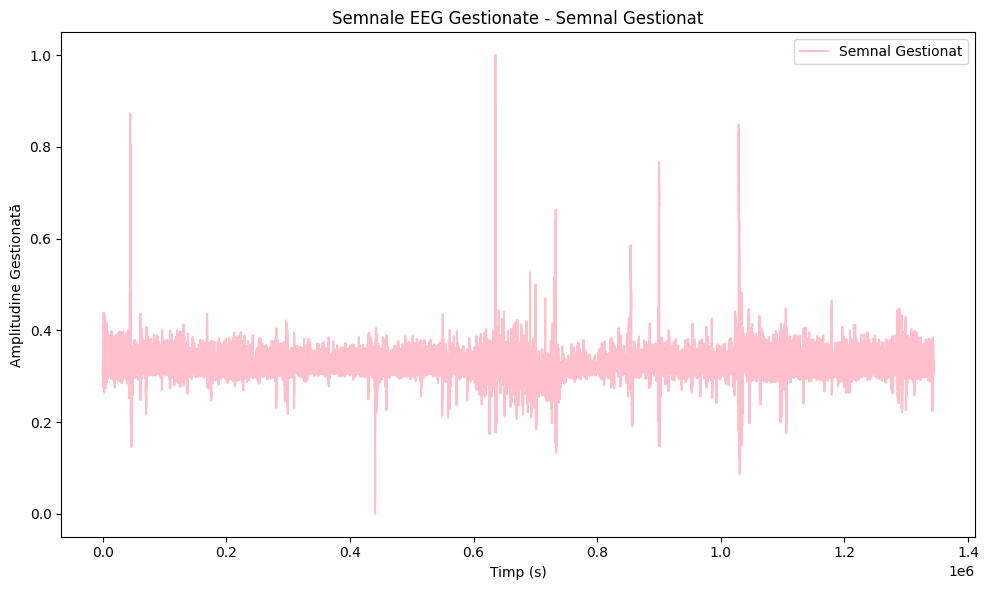

In [29]:
# Functie pentru gestiunea valorilor lipsa (si inlocuire cu media)
def handle_missing_data(data):
    # Inlocuirea valorilor NaN cu media semnalului
    nan_indices = np.isnan(data)
    data[nan_indices] = np.nanmean(data)
    return data

# Aplicam gestiunea lipsei de date
handled_signals = [handle_missing_data(signal) for signal in normalized_signals]

# Functie pentru a vizualiza semnalele
def plot_handled_signals(handled_signals, title="Semnale EEG Gestionate"):
    plt.figure(figsize=(10, 6))

    # Grafic pentru semnalele gestionate
    plt.plot(handled_signals[0], label='Semnal Gestionat', color='pink')  # Afisare semnal gestionat
    plt.title(f"{title} - Semnal Gestionat")
    plt.xlabel("Timp (s)")
    plt.ylabel("Amplitudine Gestionată")
    plt.legend(loc="best")

    plt.tight_layout()
    plt.show()

# Apelare functie pentru a vizualiza semnalele gestionate
plot_handled_signals(handled_signals)



In [22]:
# Functia de extragere a puterii semnalului intr-o fereastra
def extract_power(data, sfreq, window_size=2, step_size=1):
    window_samples = int(window_size * sfreq)
    step_samples = int(step_size * sfreq)
    powers = []

    for start in range(0, len(data) - window_samples, step_samples):
        end = start + window_samples
        window_data = data[start:end]
        power = np.sum(window_data**2)  # Puterea semnalului
        powers.append(power)

    return np.array(powers)

# Extragem puterea semnalului pentru fiecare semnal EEG
powers = [extract_power(signal, raw.info['sfreq']) for signal, raw in zip(handled_signals, raws)]
print(powers)


[array([100.06622203, 102.74857647, 102.92458775, ..., 105.46928254,
        97.5846691 , 103.85566064]), array([475.28733204, 472.03757836, 472.93046596, ..., 487.5840202 ,
       480.04070682, 473.18756812]), array([50.91746566, 51.23396547, 53.35771613, ..., 52.66463845,
       52.21087239, 52.61461601]), array([86.75468653, 86.56598452, 86.11551158, ..., 81.9331643 ,
       83.47379635, 83.39124927]), array([523.12392335, 528.0217529 , 537.2641102 , ..., 544.28724578,
       523.33969437, 545.36929671])]


In [20]:
import re

# Calea catre fisierul cu anotarile crizelor
seizure_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\Seizures-list-PN00.txt"

# Citim fisierul si incarcam continutul sau
with open(seizure_file_path, 'r') as file:
    seizure_data_raw = file.read()

# Verificam primele 500 de caractere din fisier pentru a intelege structura
print(seizure_data_raw[:500])

# Se extrag informatiile despre crize folosind expresii regulate
seizure_pattern = re.compile(r'Seizure n (\d+)\s*File name: (\S+)\s*Registration start time: (\S+)\s*Registration end time: (\S+)\s*Seizure start time: (\S+)\s*Seizure end time: (\S+)')
seizures = seizure_pattern.findall(seizure_data_raw)

# Afisare crize extrase
for seizure in seizures:
    print(f"Seizure {seizure[0]} - File: {seizure[1]}")
    print(f"  Registration Start: {seizure[2]}, End: {seizure[3]}")
    print(f"  Seizure Start: {seizure[4]}, End: {seizure[5]}")
    print("------")


PN00

Data Sampling Rate: 512 Hz

Channels in EDF files:
Channel 1: Fp1      
Channel 2: F3      
Channel 3: C3      
Channel 4: P3      
Channel 5: 1      
Channel 6: F7      
Channel 7: T3      
Channel 8: T5      
Channel 9: Fc1      
Channel 10: Fc5      
Channel 11: Cp1      
Channel 12: Cp5      
Channel 13: F9      
Channel 14: Fz      
Channel 15: Cz      
Channel 16: Pz      
Channel 17: Fp2      
Channel 18: F4      
Channel 19: C4      
Channel 20: P4      
Channel 21: O2      
Channe
Seizure 3 - File: PN00-3.edf
  Registration Start: 18.15.44, End: 18.57.13
  Seizure Start: 18.28.29, End: 19.29.29
------
Seizure 4 - File: PN00-4.edf
  Registration Start: 20.51.43, End: 21.26.25
  Seizure Start: 21.08.29, End: 21.09.43
------


Procesare pacient: PN00
Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 19:39:33 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:22: RuntimeWarning: invalid value encountered in divide
  return (signal_data - np.mean(signal_data)) / np.std(signal_data)


Puterea semnalului pentru fișierul D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf:
  Canal EEG Fp1: 0.9022329006553882
  Canal EEG F3: 0.605817198704022
  Canal EEG C3: 0.7604462470547577
  Canal EEG P3: 0.6532687183118207
  Canal EEG O1: 0.43722002422056205
  Canal EEG F7: 0.7393571647930529
  Canal EEG T3: 0.7793260068775807
  Canal EEG T5: 1.1402976370044073
  Canal EEG Fc1: 0.6516410219545526
  Canal EEG Fc5: 0.673037009920419
  Canal EEG Cp1: 0.36678684983681187
  Canal EEG Cp5: 0.83974069575176
  Canal EEG F9: 0.9945311074303299
  Canal EEG Fz: 0.42619488788017174
  Canal EEG Cz: 0.3110077395633706
  Canal EEG Pz: 0.564620725614595
  Canal EEG Fp2: 0.6077332095653608
  Canal EEG F4: 0.6587726134589648
  Canal EEG C4: 0.6672799384022715
  Canal EEG P4: 0.8998599310497305
  Canal EEG O2: 0.6519684814432977
  Canal EEG F8: 0.8796188568627046
  Canal EEG T4: 0.7641913733284196
  Canal EEG T6: 0.8364530901994

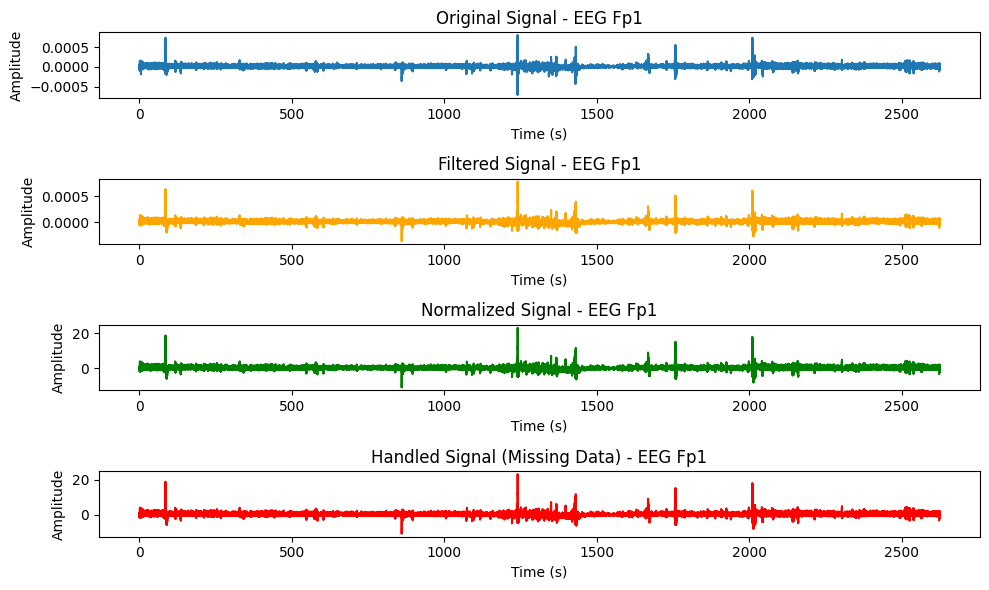

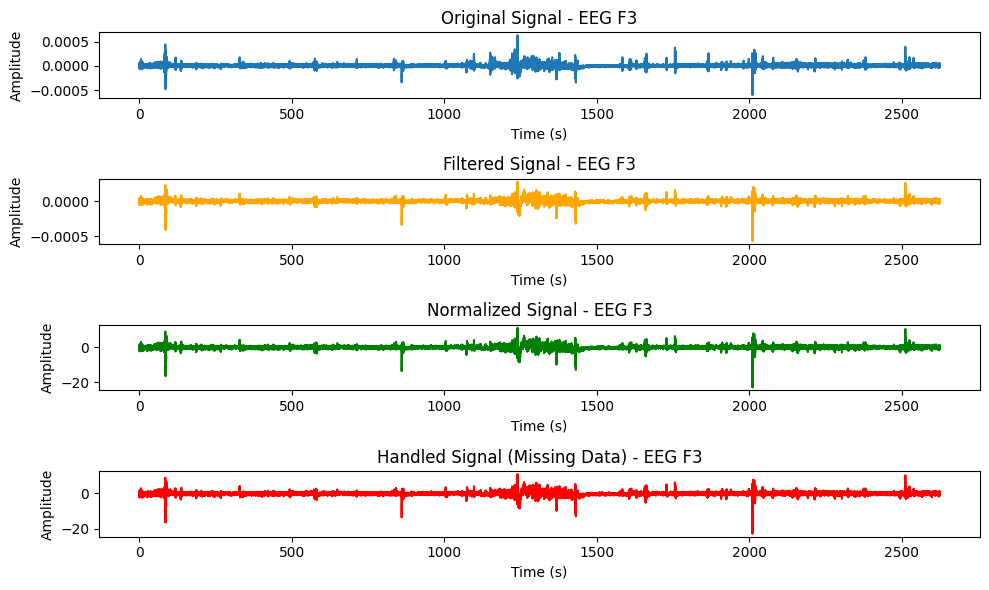

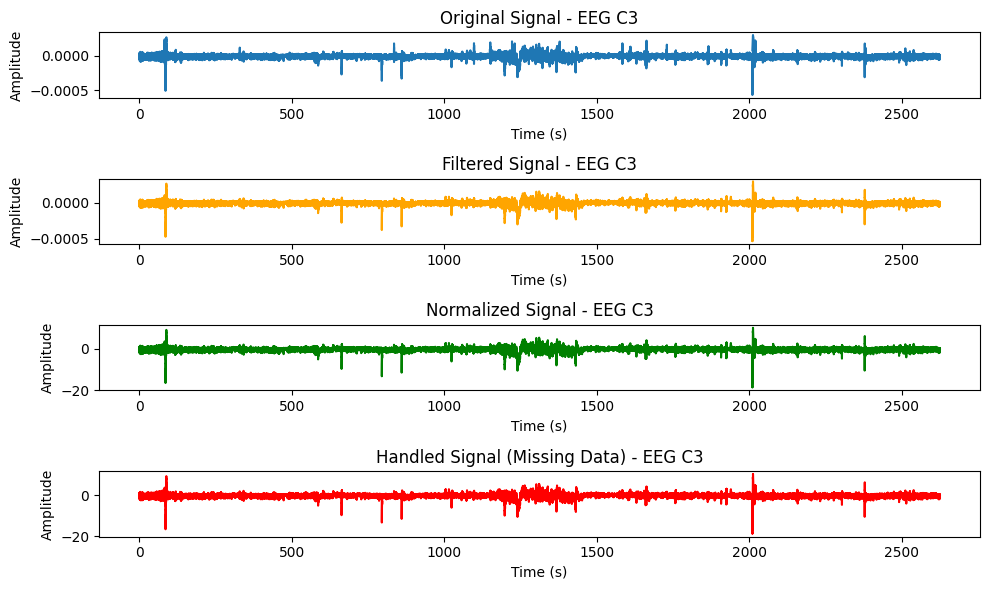

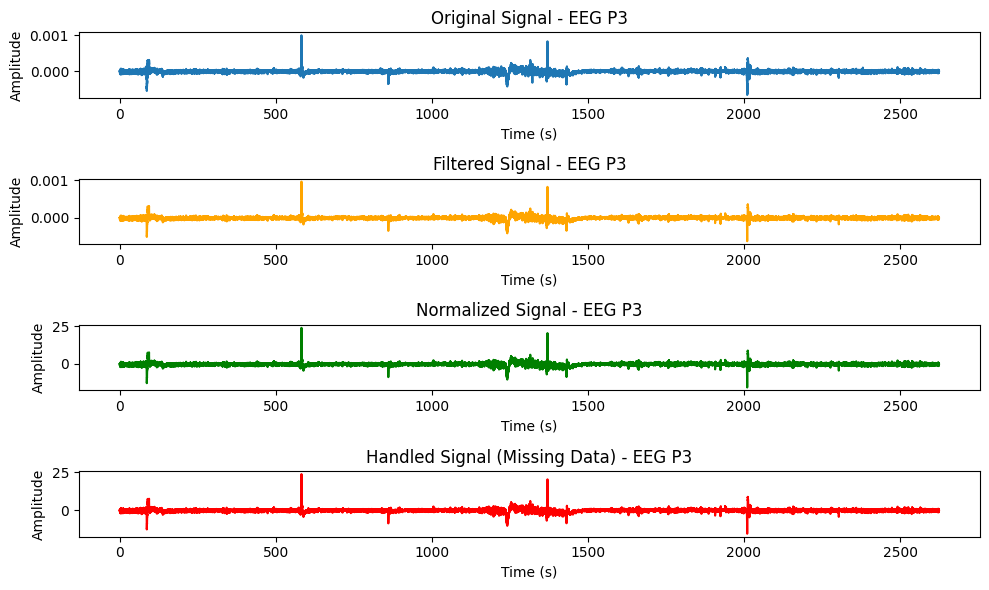

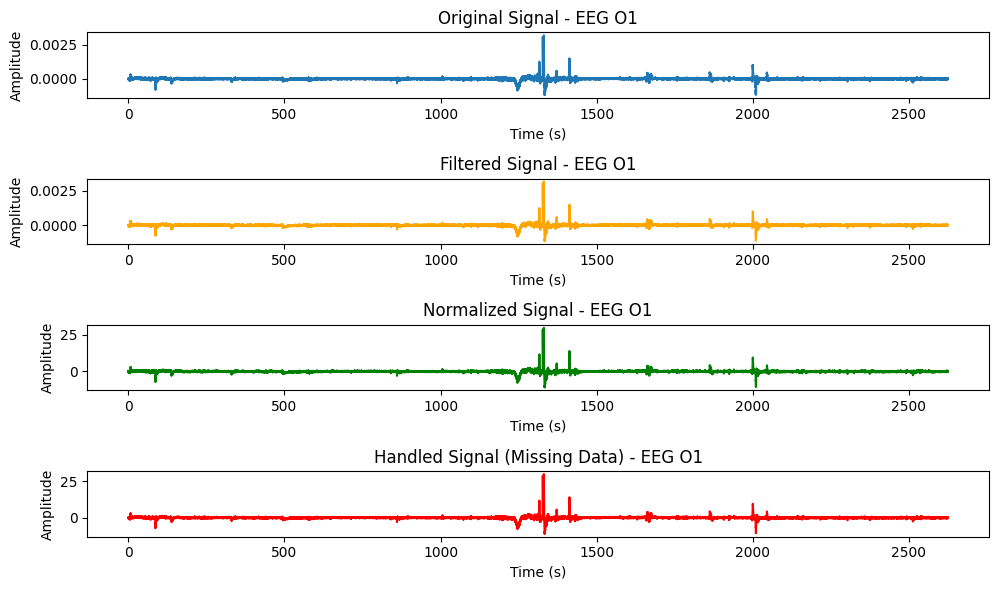

...

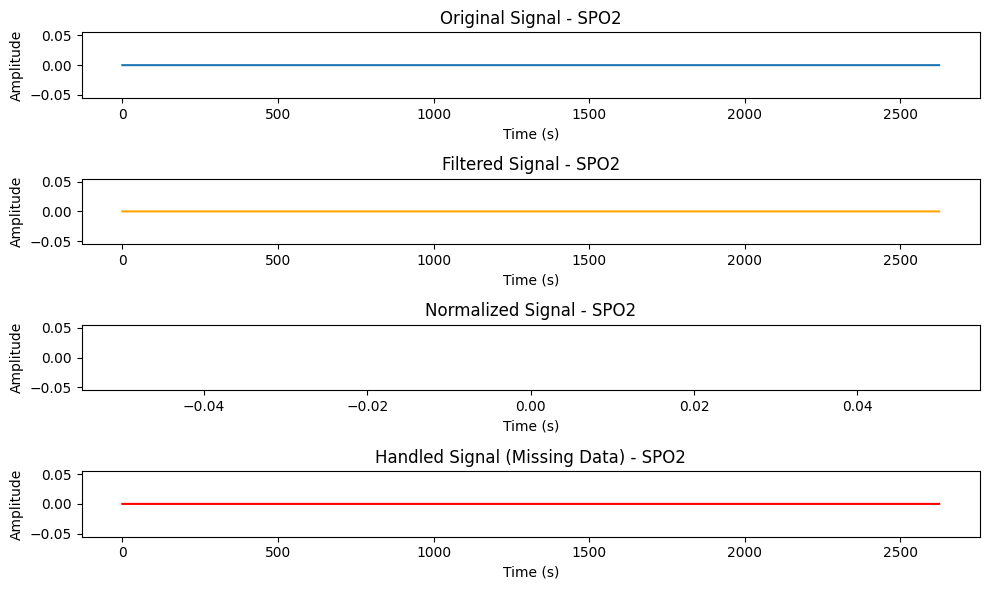

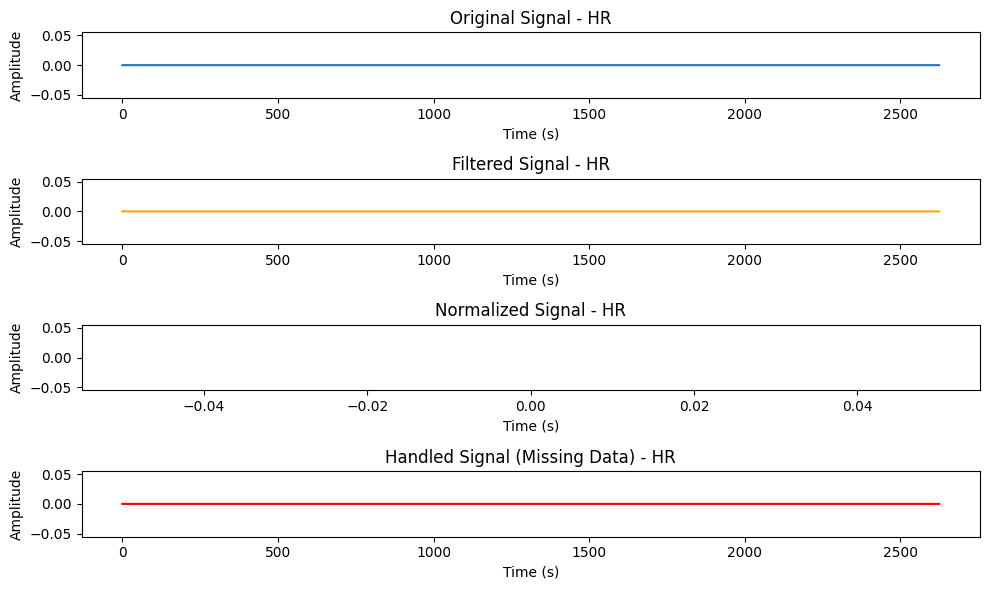

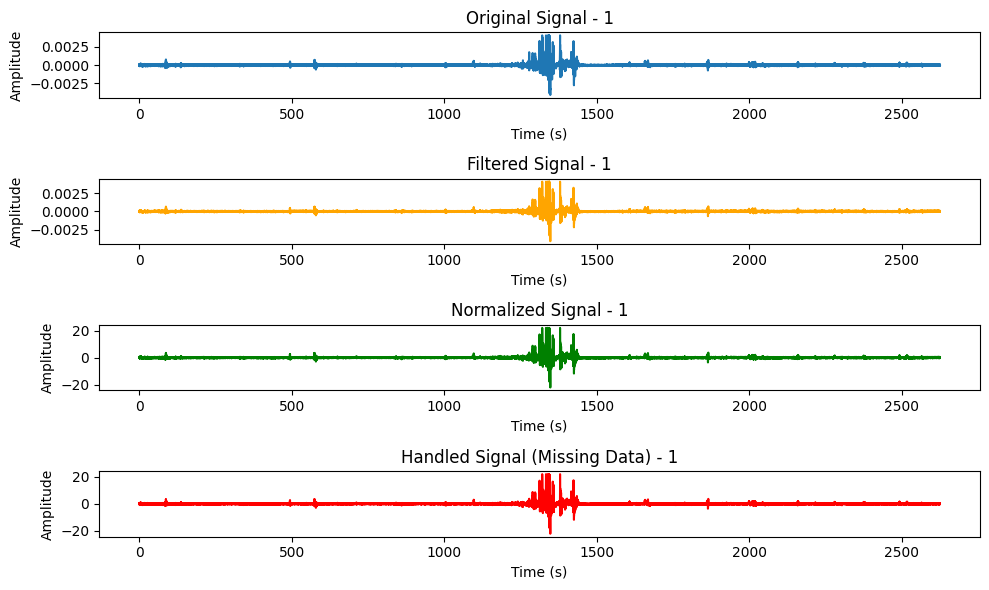

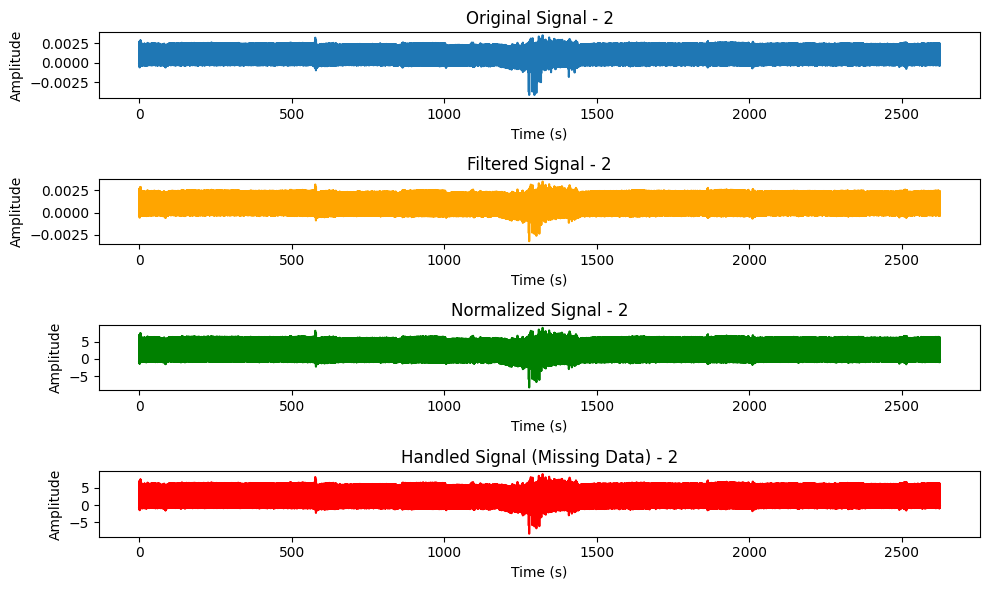

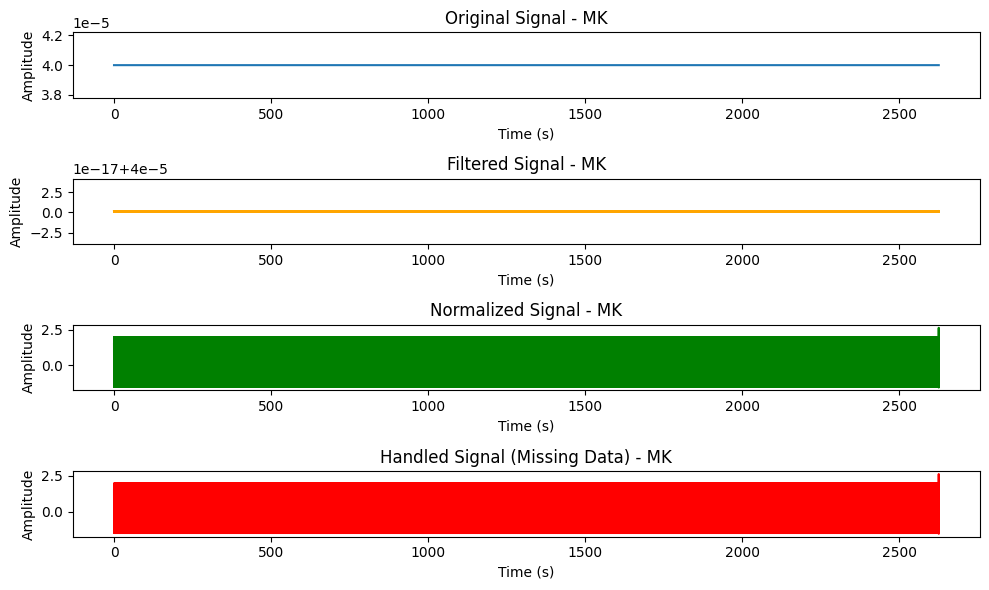

Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 02:18:17 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Puterea semnalului pentru fișierul D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf:
  Canal EEG Fp1: 0.3986302643875405
  Canal EEG F3: 0.1598066506658666
  Canal EEG C3: 0.4742083002264554
  Canal EEG P3: 0.5693573406646812
  Canal EEG O1: 0.25161494187504835
  Canal EEG F7: 0.13358464529657538
  Canal EEG T3: 0.2863616980696194
  Canal EEG T5: 0.5336981896361301
  Canal EEG Fc1: 0.4472076160881943
  Canal EEG Fc5: 0.21029260793609003
  Canal EEG Cp1: 0.29499499563087617
  Canal EEG Cp5: 0.8774355587038358
  Canal EEG F9: 0.7599966461293568
  Canal EEG Fz: 0.19818256465510978
  Canal EEG Cz: 0.4234521302431667
  Can

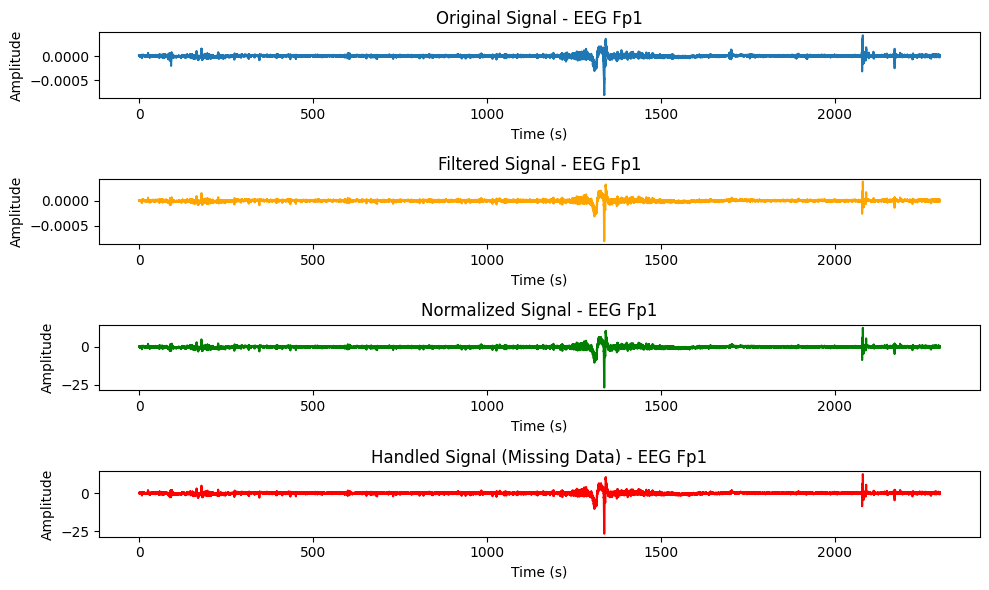

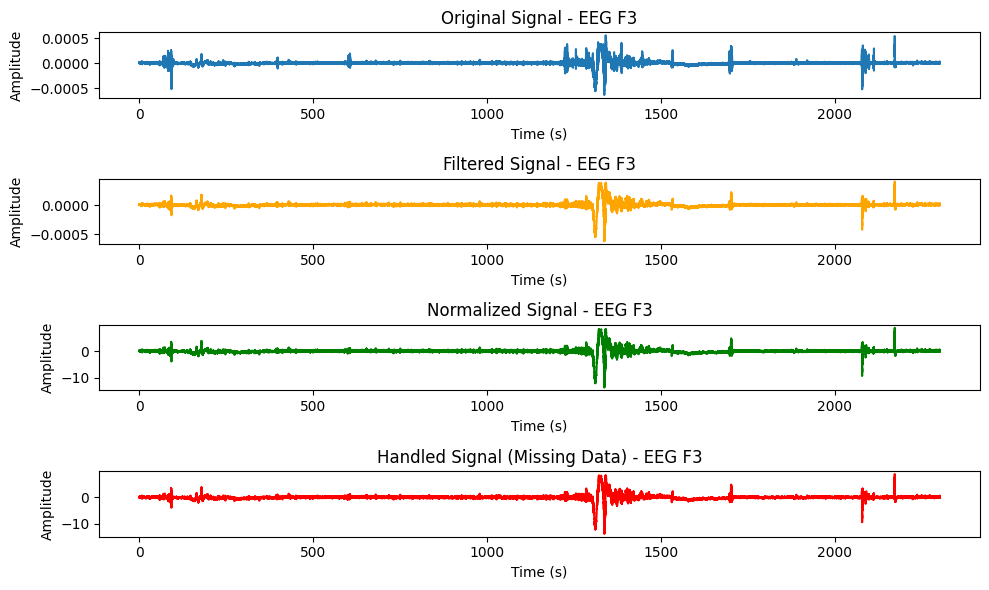

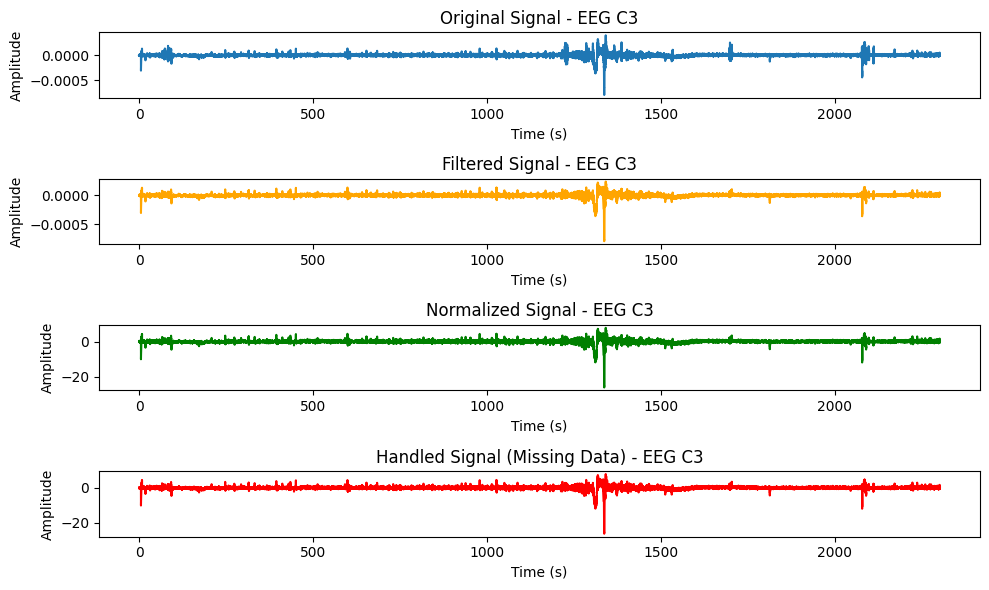

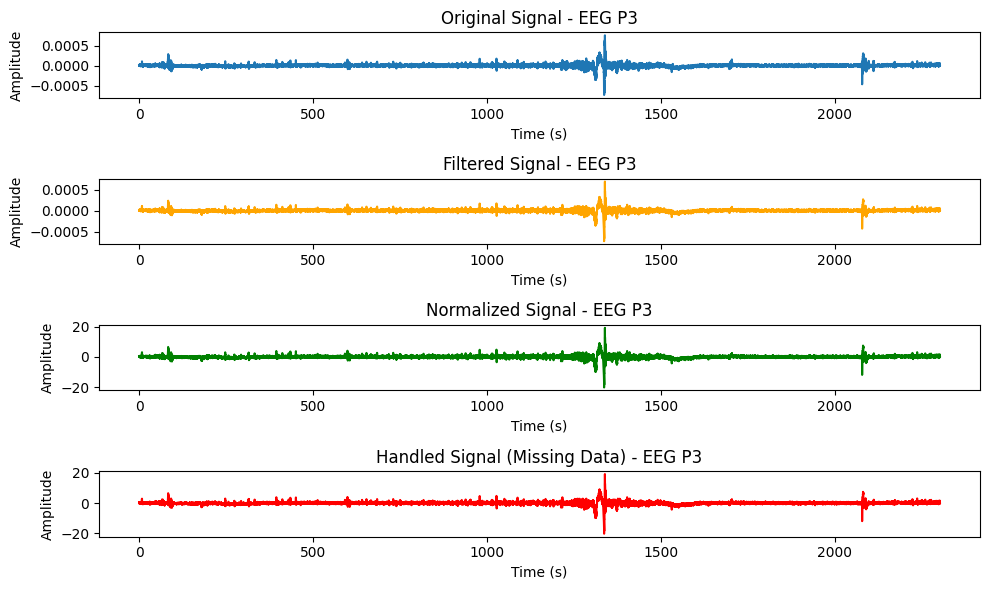

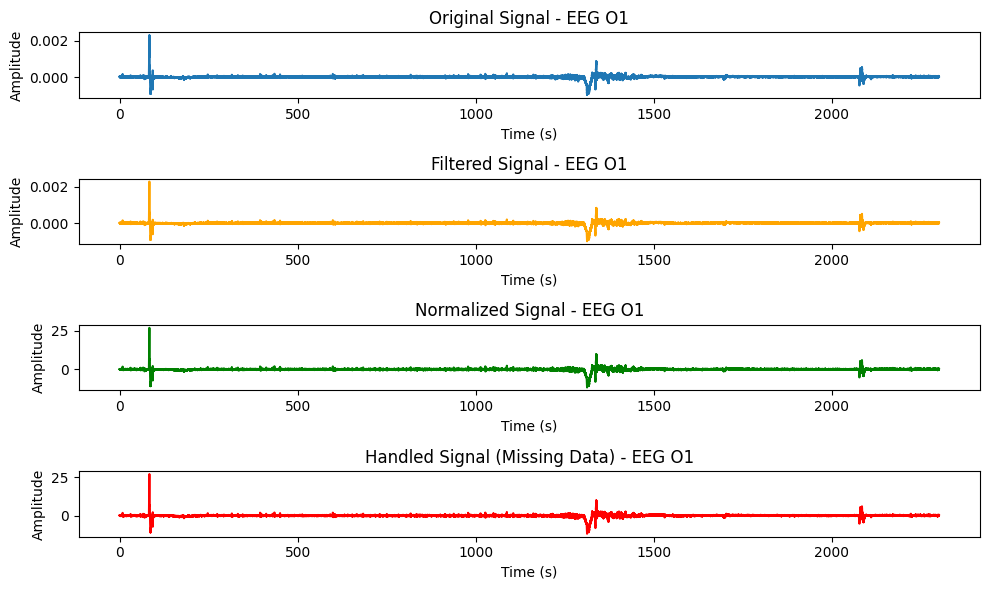

...

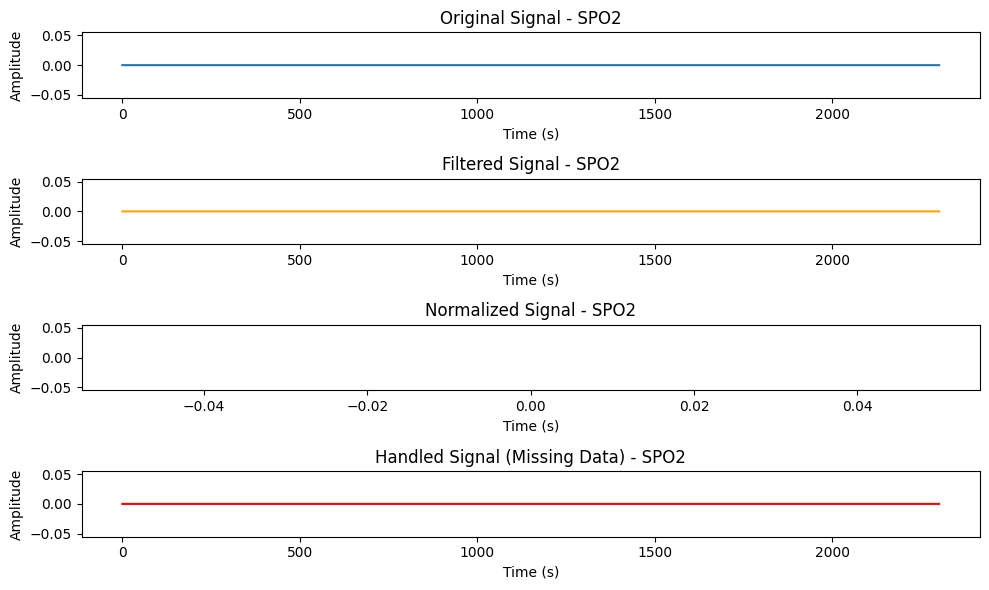

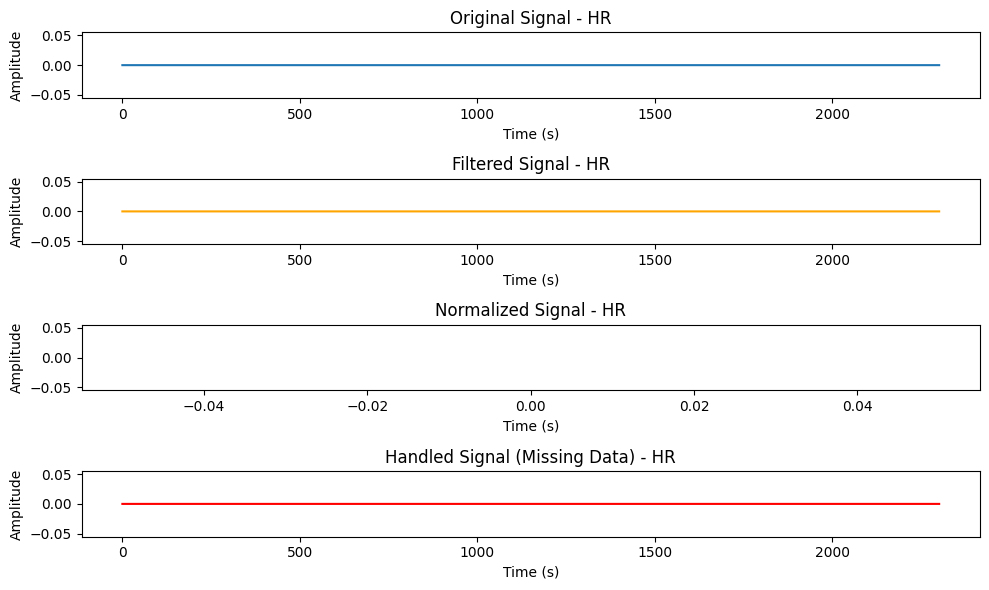

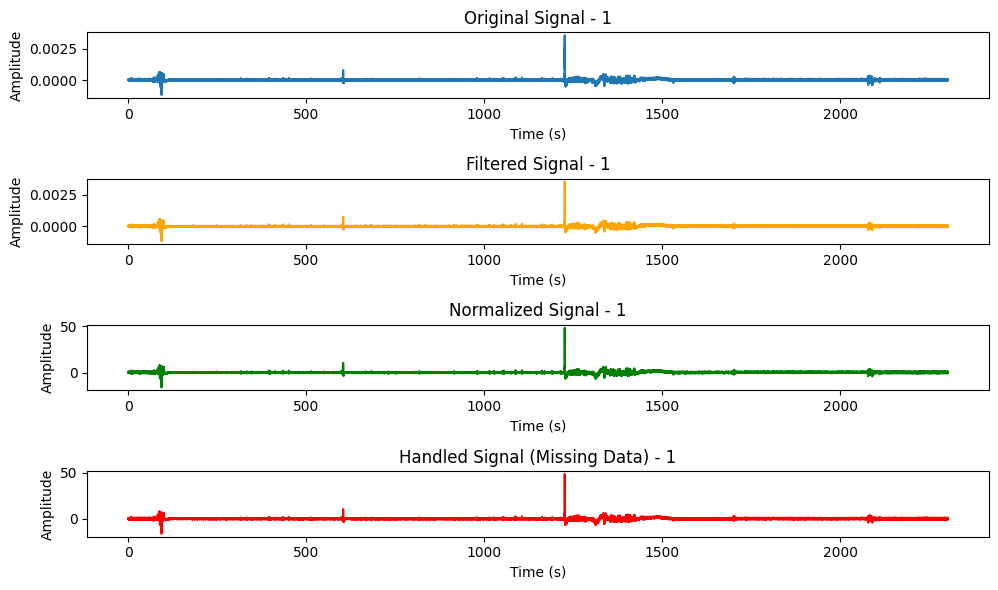

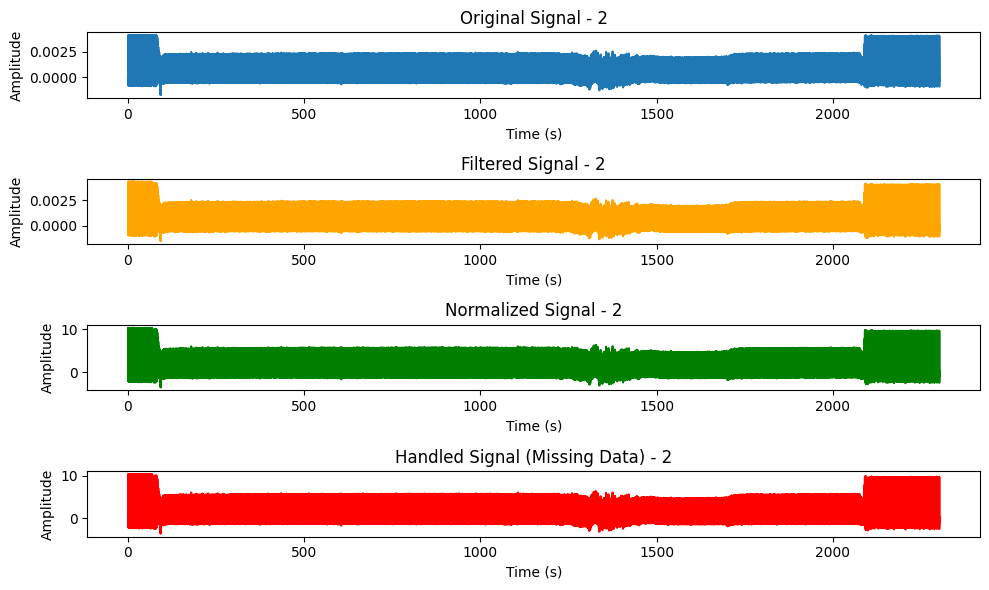

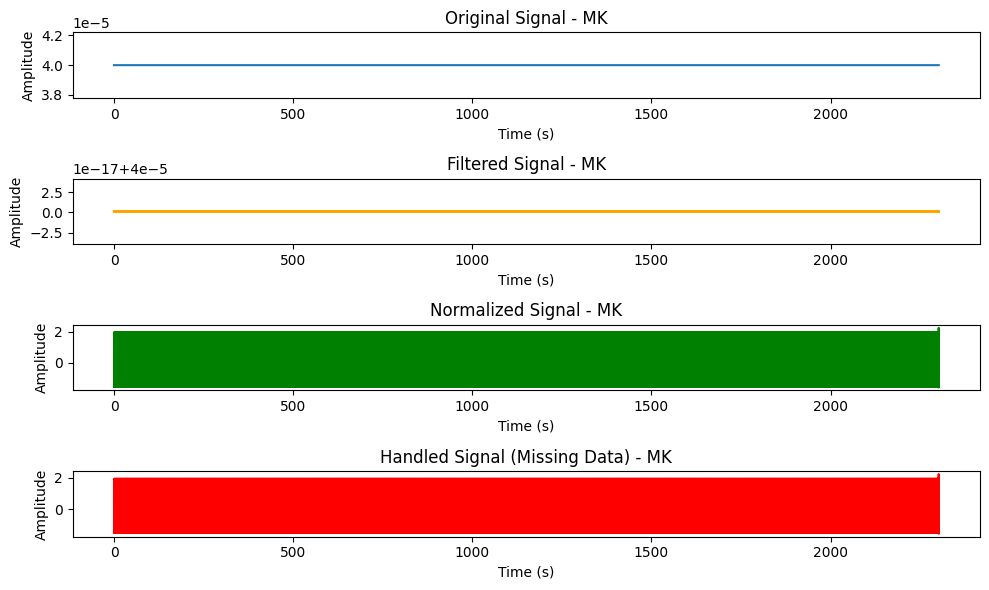

Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1284607  =      0.000 ...  2508.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 18:15:44 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Puterea semnalului pentru fișierul D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf:
  Canal EEG Fp1: 0.676185908908984
  Canal EEG F3: 0.5550448643116943
  Canal EEG C3: 1.0415040868215533
  Canal EEG P3: 0.666197322305035
  Canal EEG O1: 0.5990859596808203
  Canal EEG F7: 1.0228168469609735
  Canal EEG T3: 0.9636529563070623
  Canal EEG T5: 1.1169573394217853
  Canal EEG Fc1: 0.9264705798525398
  Canal EEG Fc5: 0.451712323601296
  Canal EEG Cp1: 0.5489582505108994
  Canal EEG Cp5: 0.9756698210046588
  Canal EEG F9: 1.0754947731920526
  Canal EEG Fz: 0.5461093575716132
  Canal EEG Cz: 0.825215661291837
  Canal EEG Pz

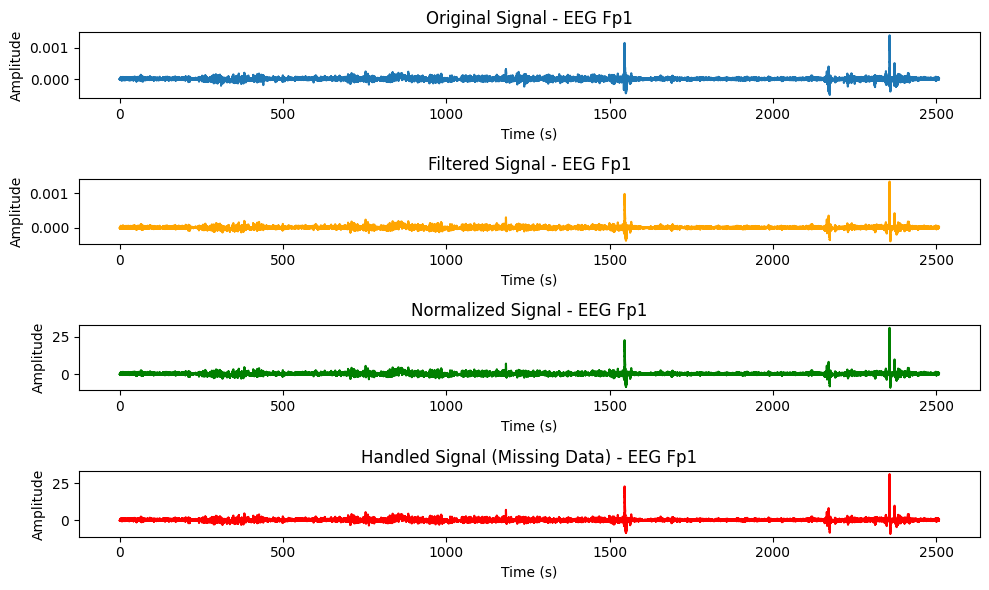

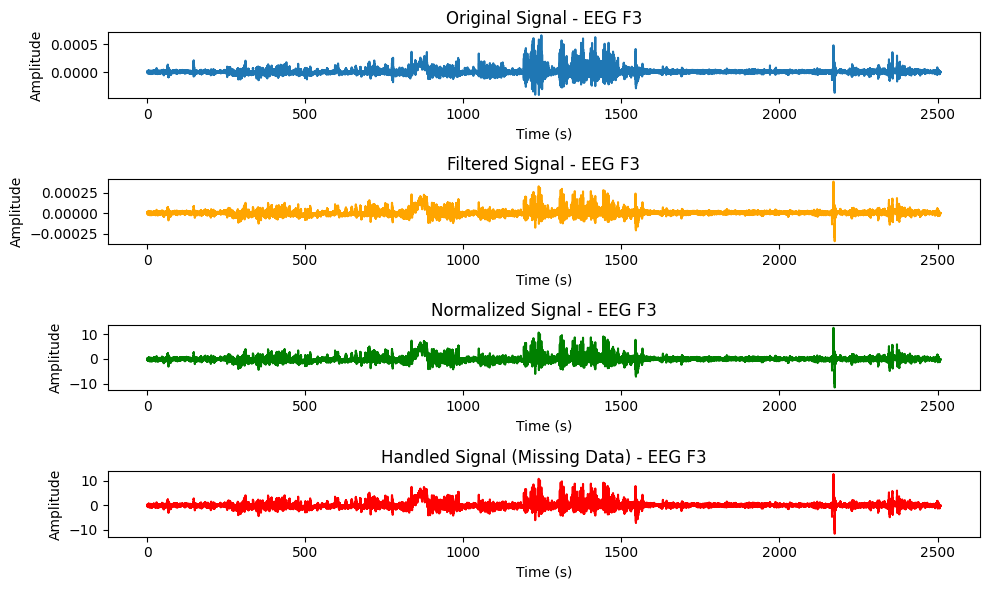

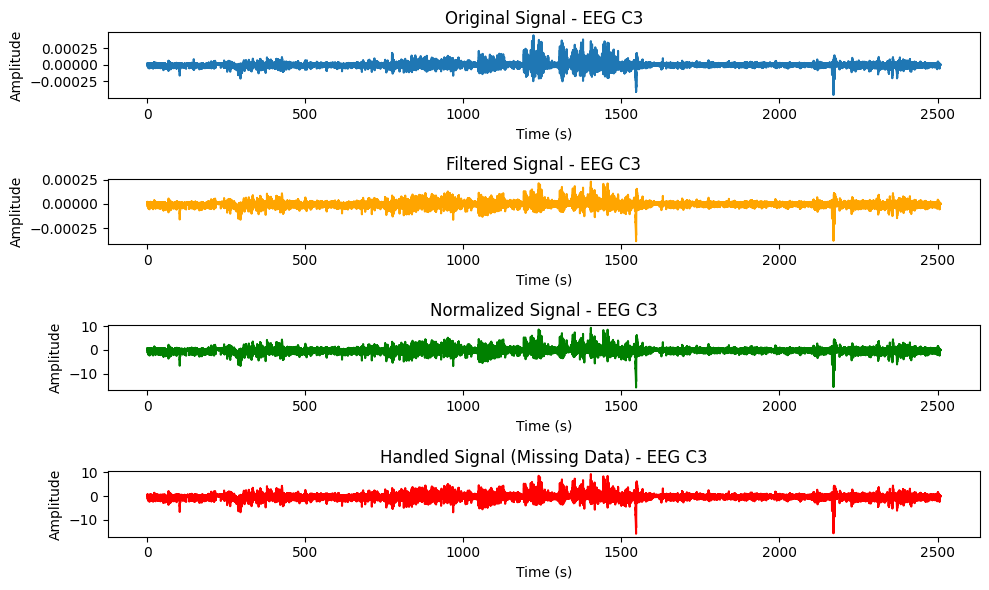

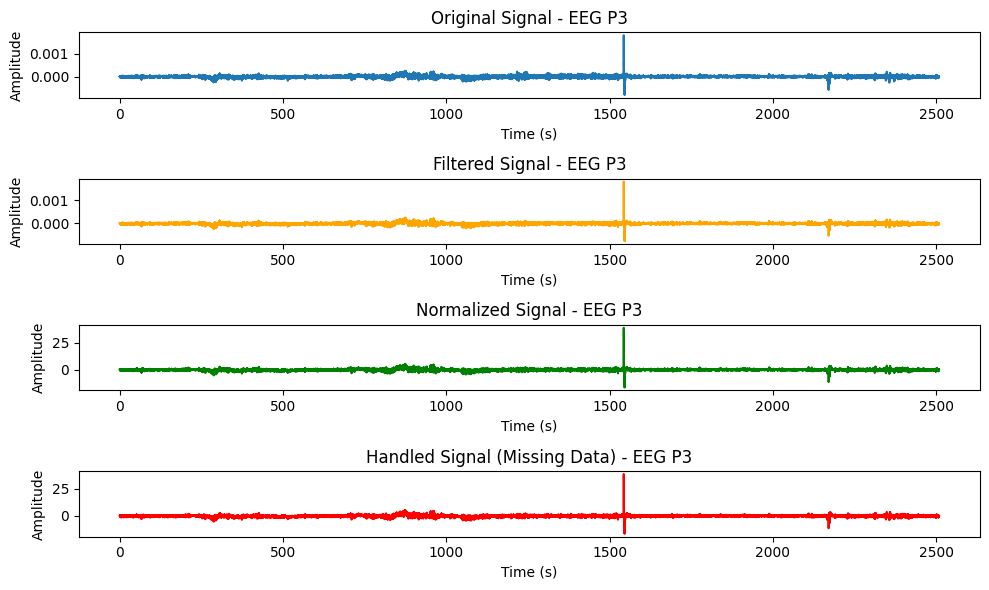

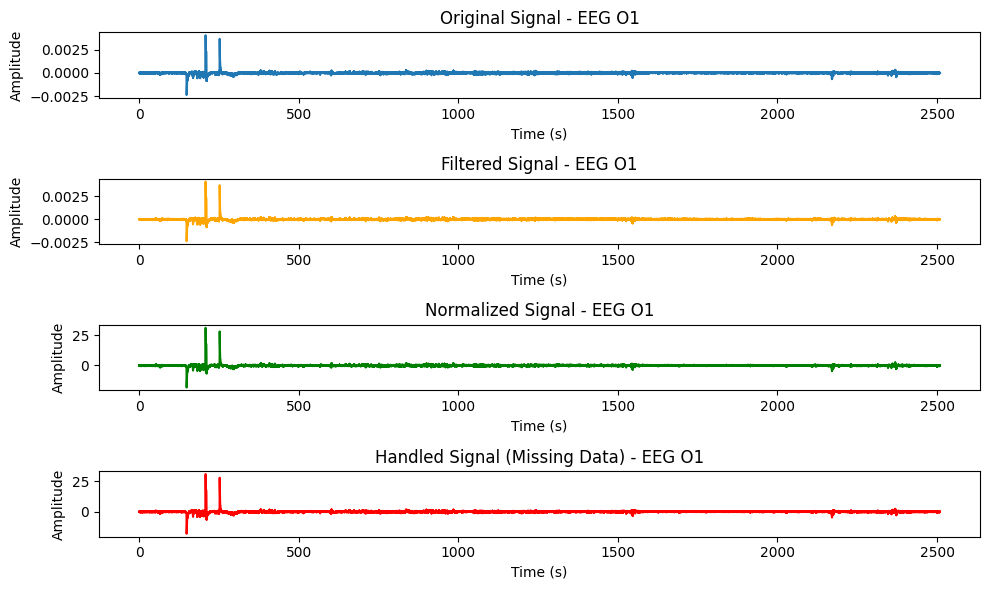

...

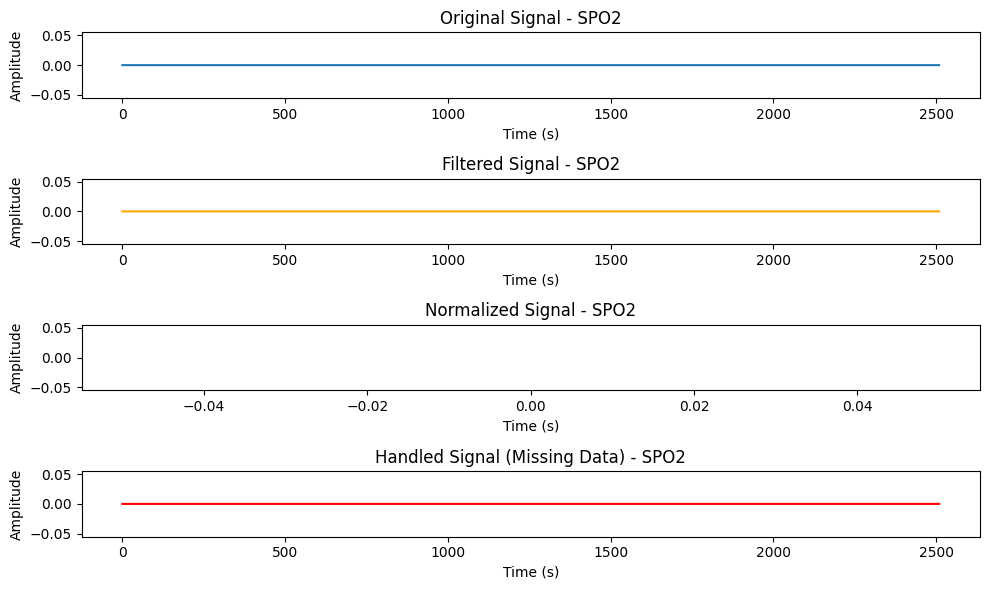

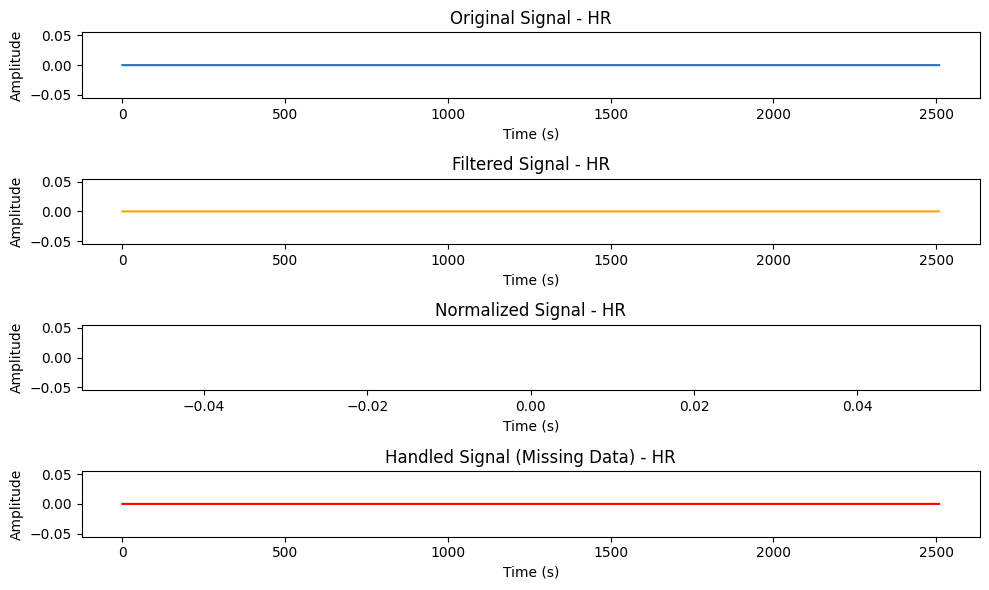

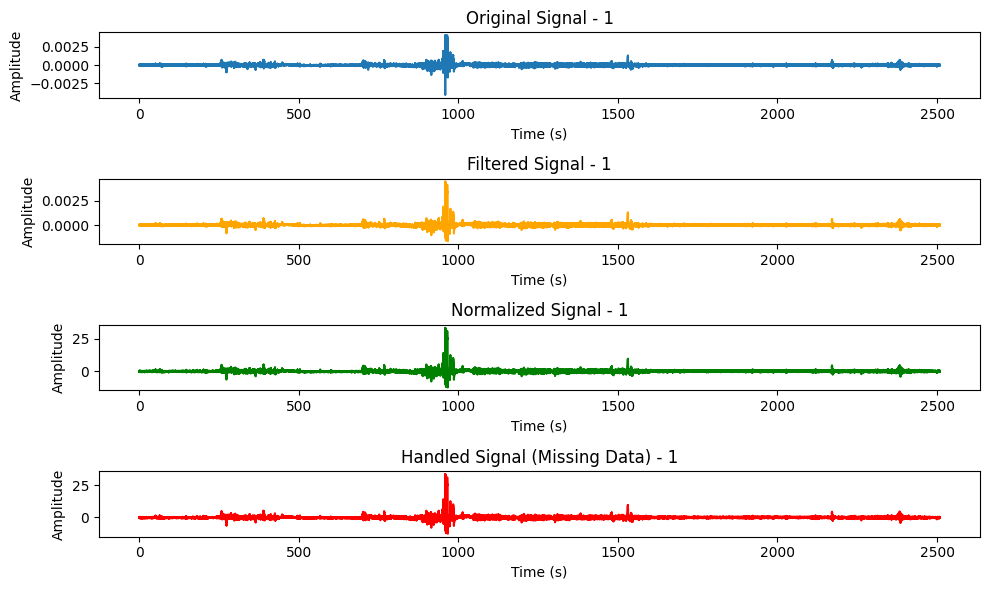

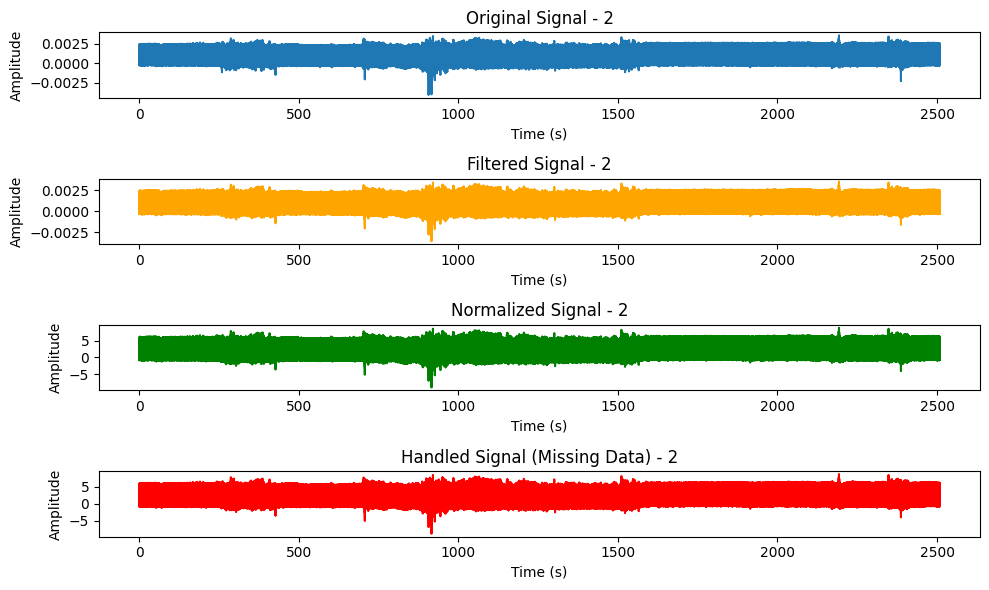

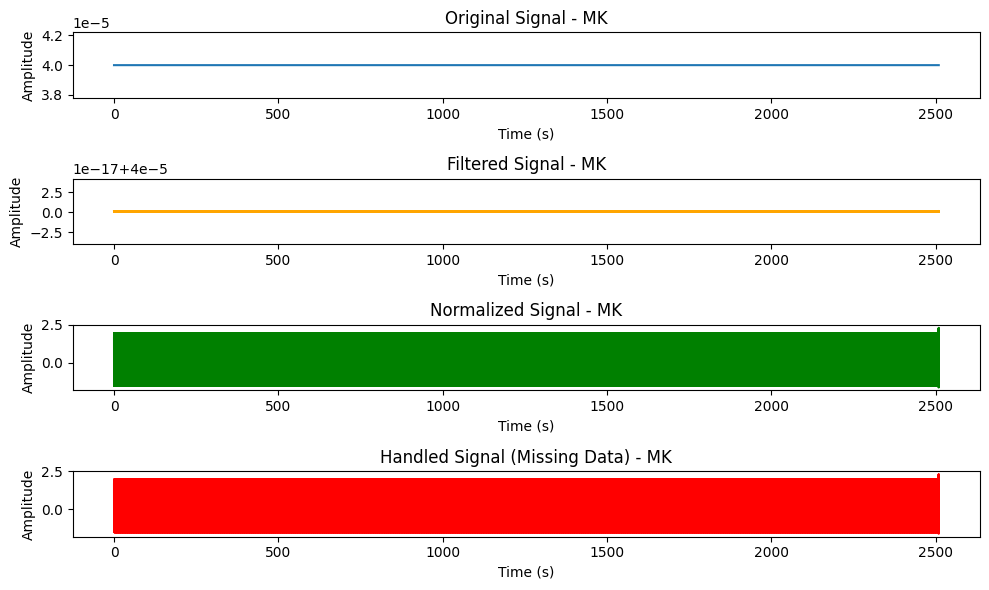

Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1076223  =      0.000 ...  2101.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 20:51:43 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Puterea semnalului pentru fișierul D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf:
  Canal EEG Fp1: 0.3615980015916213
  Canal EEG F3: 0.6682597902174737
  Canal EEG C3: 0.9384059789224178
  Canal EEG P3: 0.9018295811653037
  Canal EEG O1: 0.3963813287488068
  Canal EEG F7: 0.5602394691369796
  Canal EEG T3: 0.8891010362514333
  Canal EEG T5: 1.171346719776128
  Canal EEG Fc1: 0.7220290210832283
  Canal EEG Fc5: 0.7062382084522609
  Canal EEG Cp1: 0.7386726117633137
  Canal EEG Cp5: 0.9433019456366271
  Canal EEG F9: 0.8767595880867278
  Canal EEG Fz: 0.47978494415029116
  Canal EEG Cz: 0.5888064577878737
  Canal EE

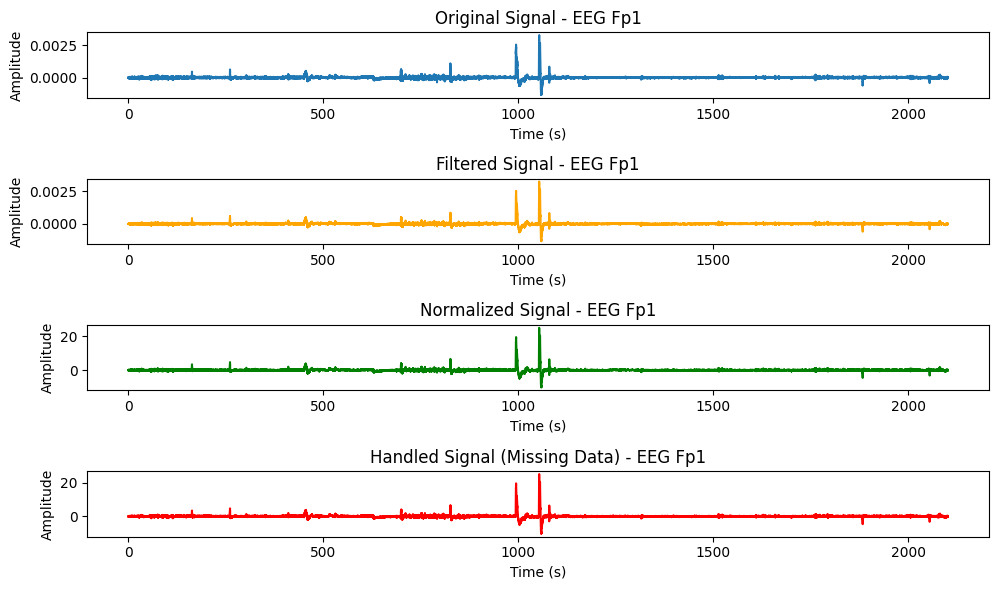

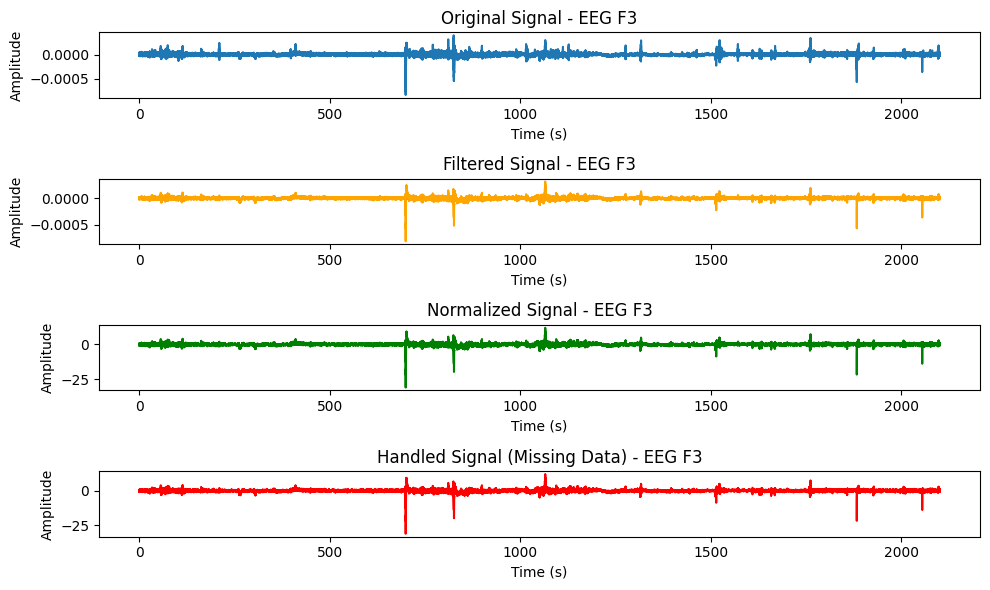

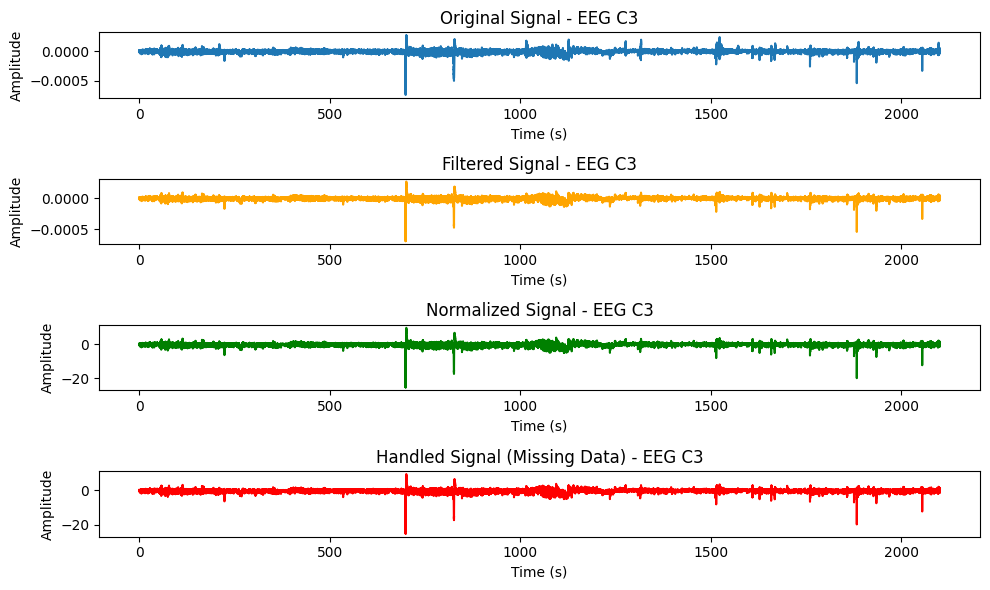

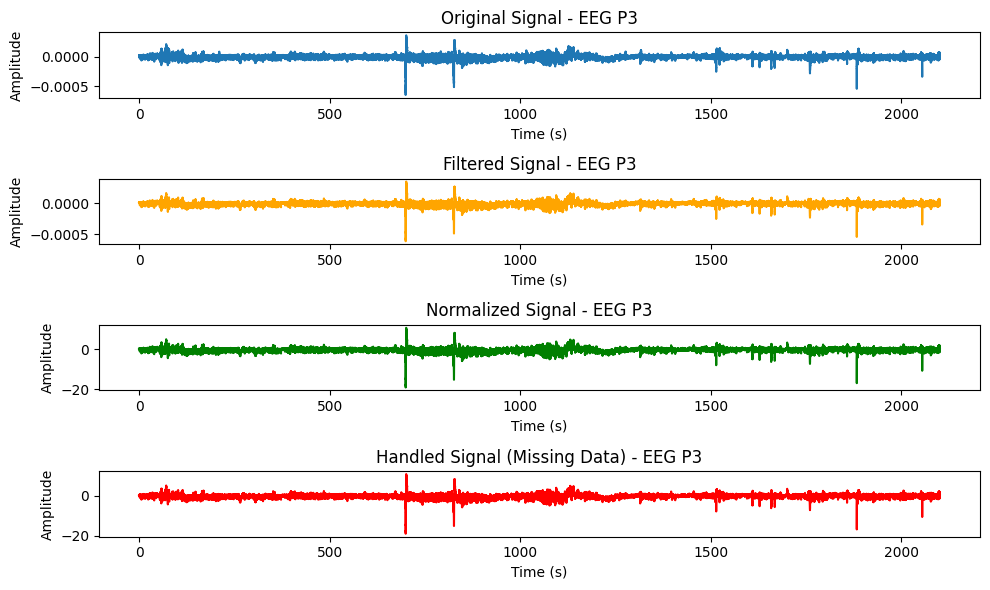

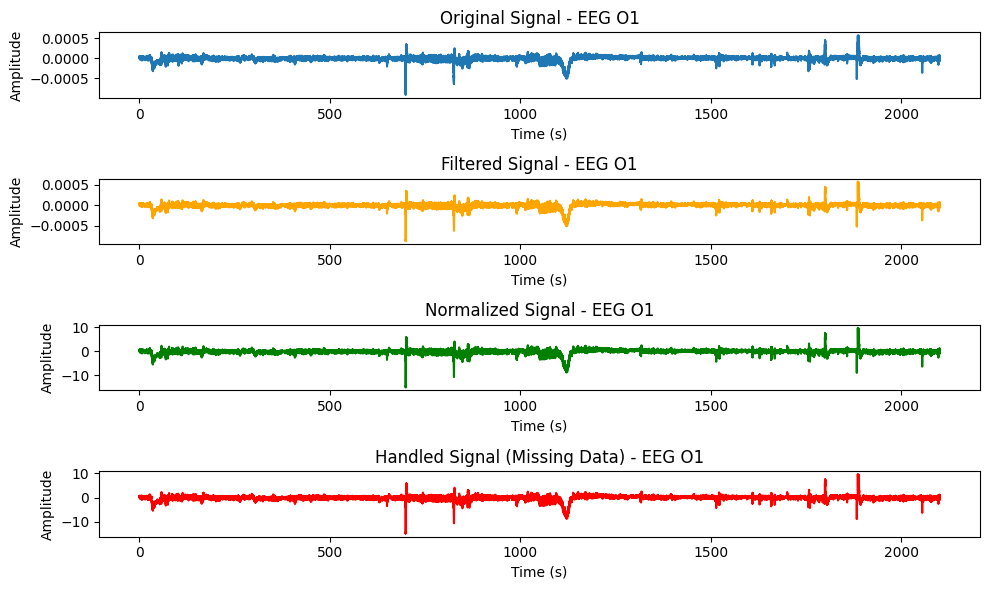

...

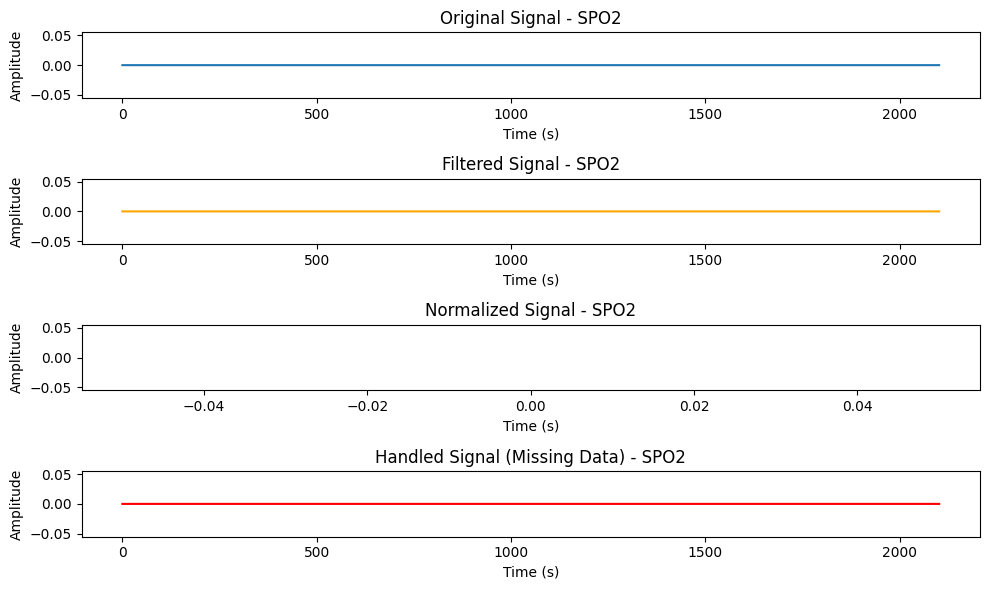

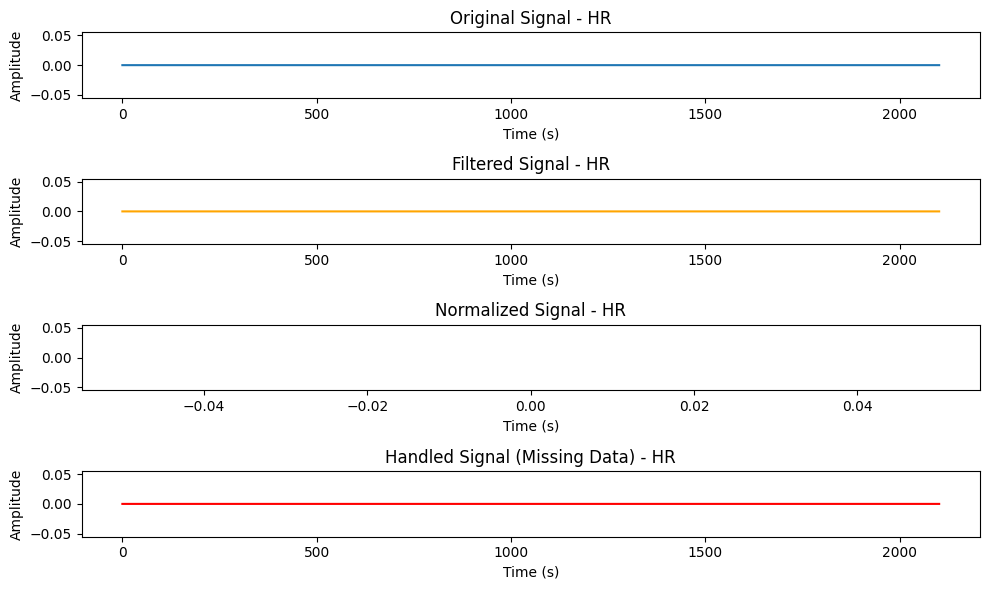

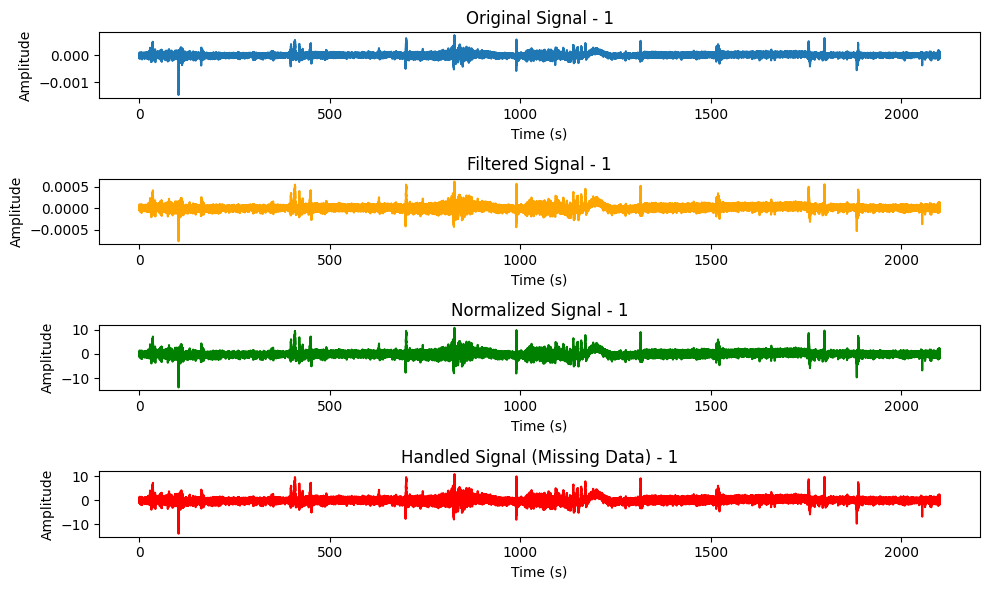

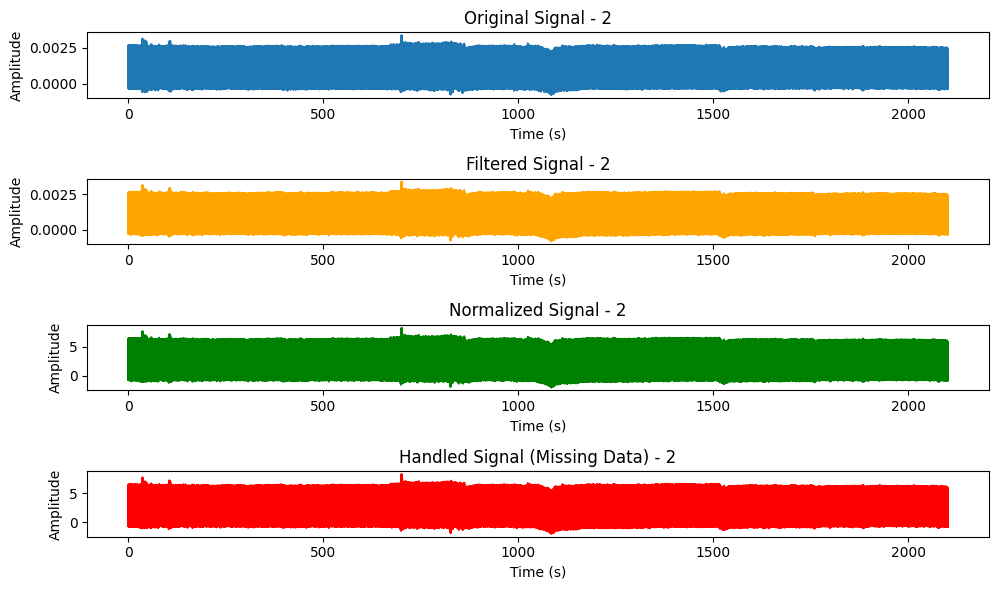

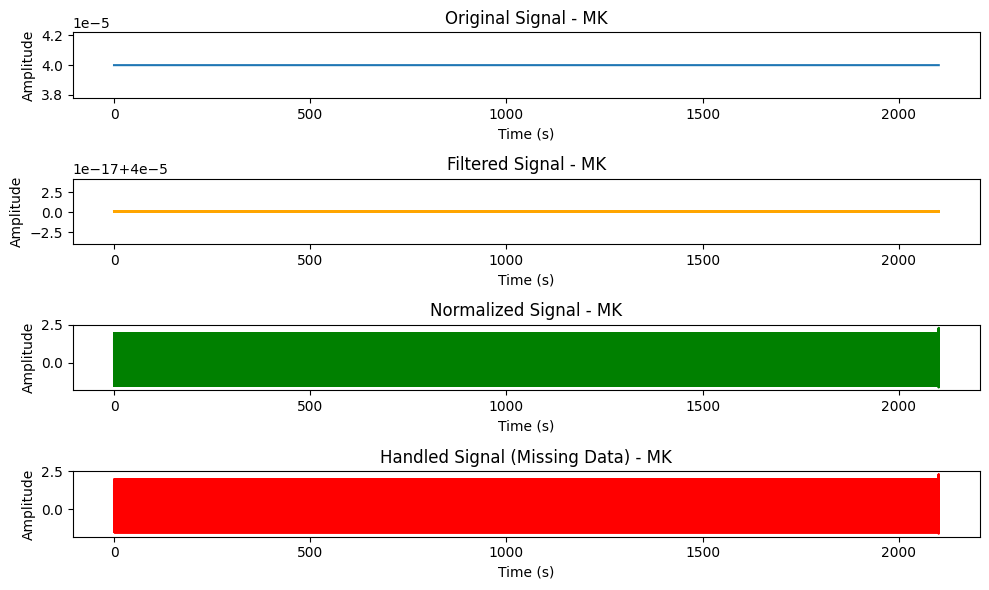

Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1097215  =      0.000 ...  2142.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 22:22:04 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>
Puterea semnalului pentru fișierul D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf:
  Canal EEG Fp1: 0.9138994373079302
  Canal EEG F3: 0.2066096916154732
  Canal EEG C3: 0.6761597308685604
  Canal EEG P3: 0.6351915106688876
  Canal EEG O1: 0.19352987205892544
  Canal EEG F7: 0.3121303789282518
  Canal EEG T3: 0.38929416863437605
  Canal EEG T5: 0.718935842169013
  Canal EEG Fc1: 1.0803826645877532
  Canal EEG Fc5: 0.28967089972915677
  Canal EEG Cp1: 0.3678228783950986
  Canal EEG Cp5: 0.7762461270466053
  Canal EEG F9: 1.0341961833886415
  Canal EEG Fz: 0.3411135363352246
  Canal EEG Cz: 0.9901843303721266
  Canal 

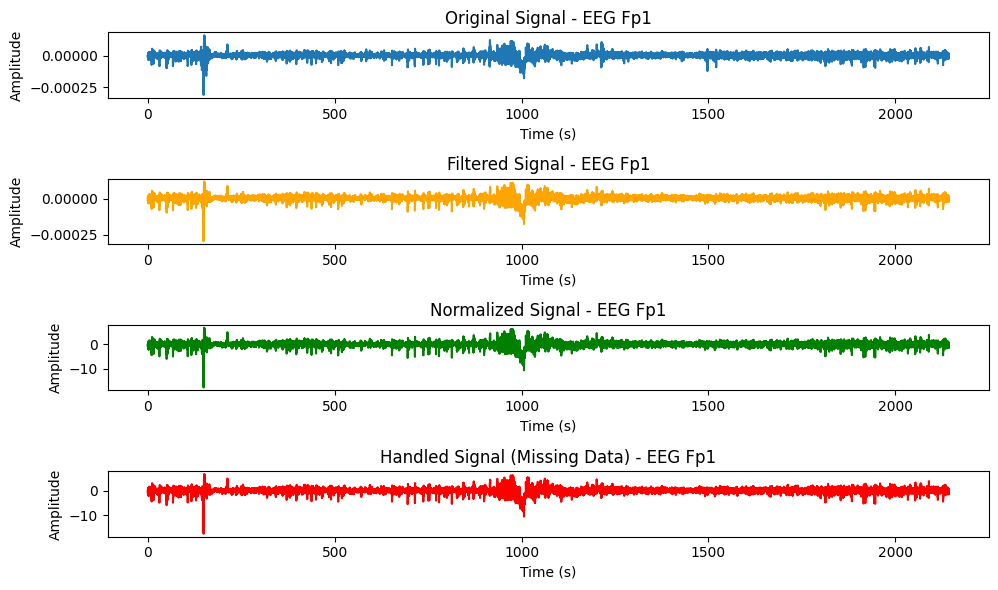

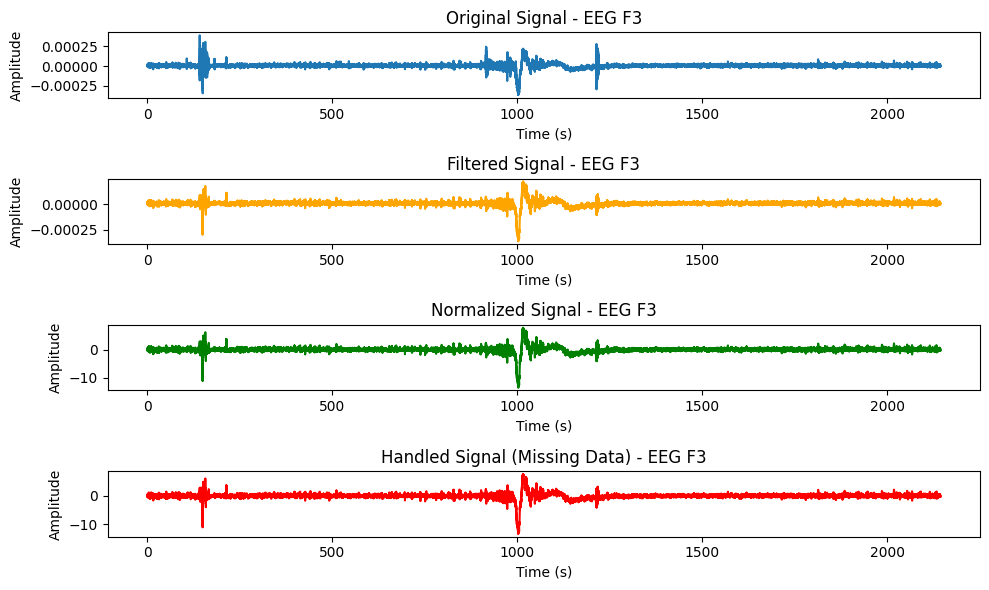

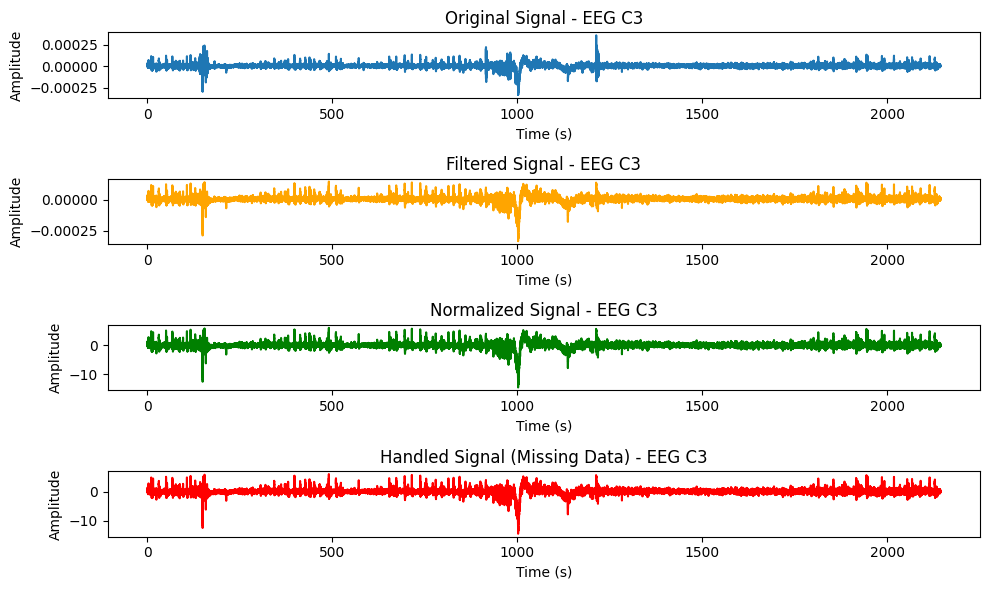

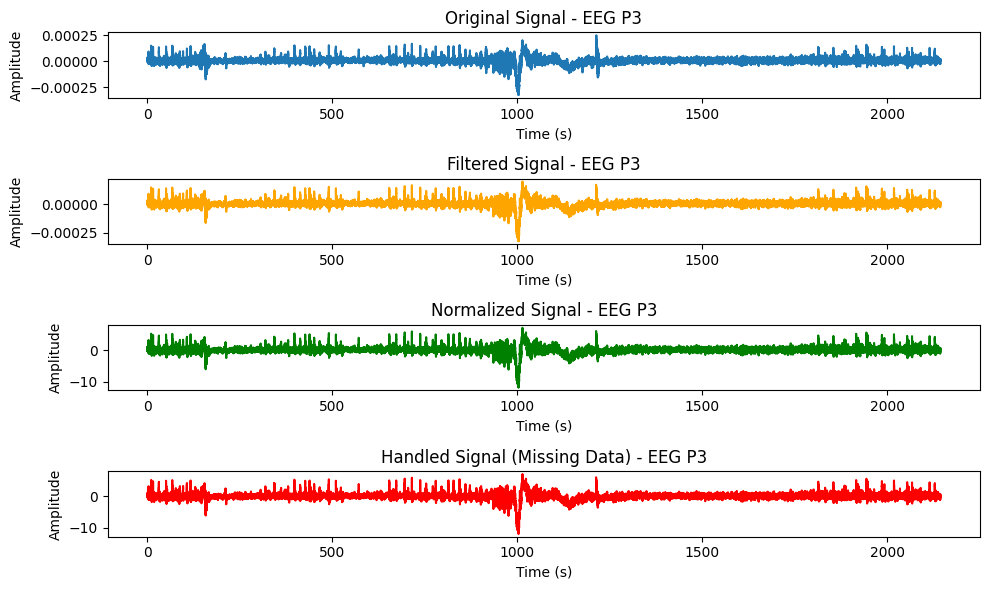

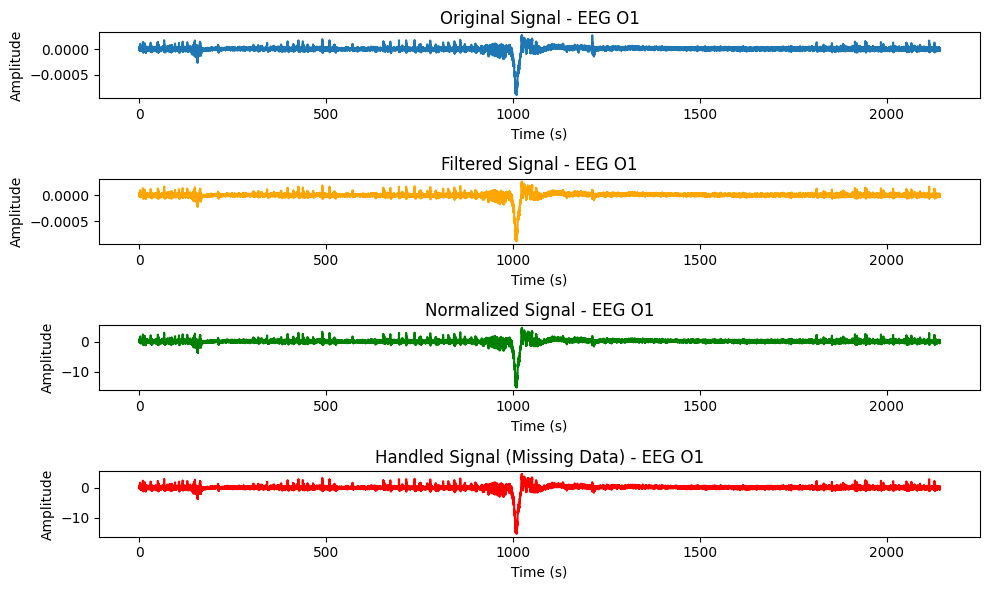

...

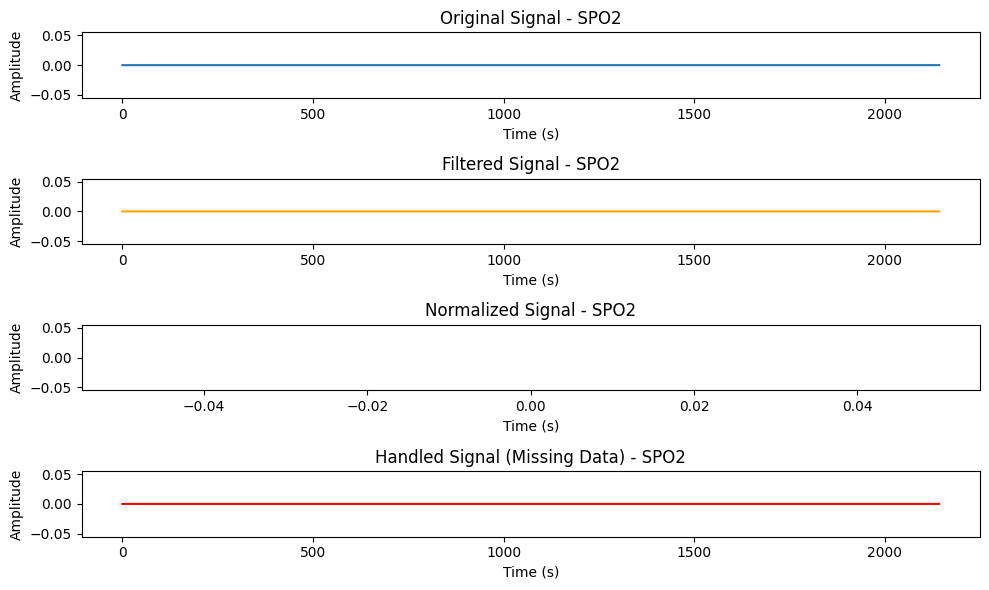

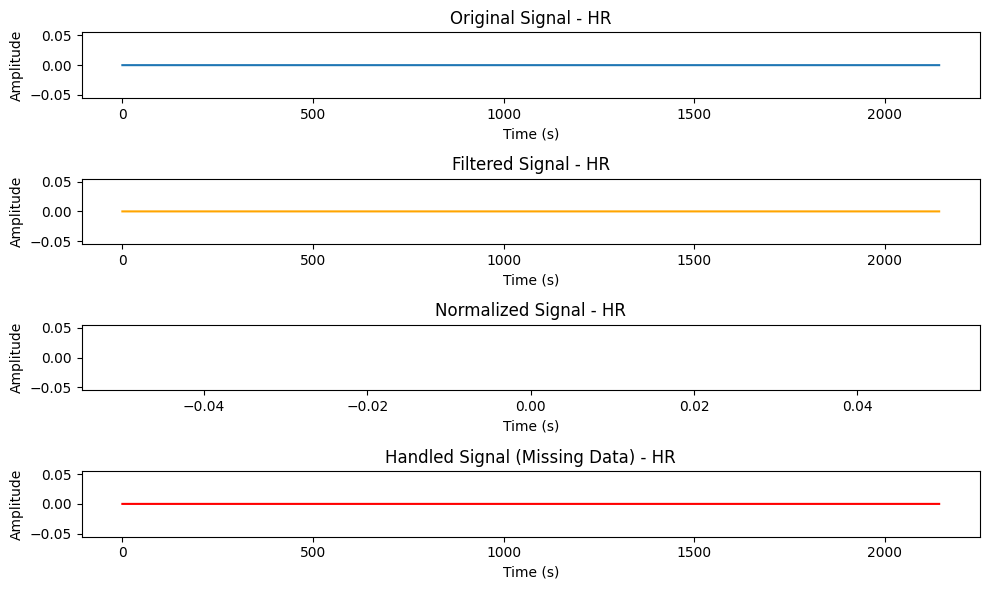

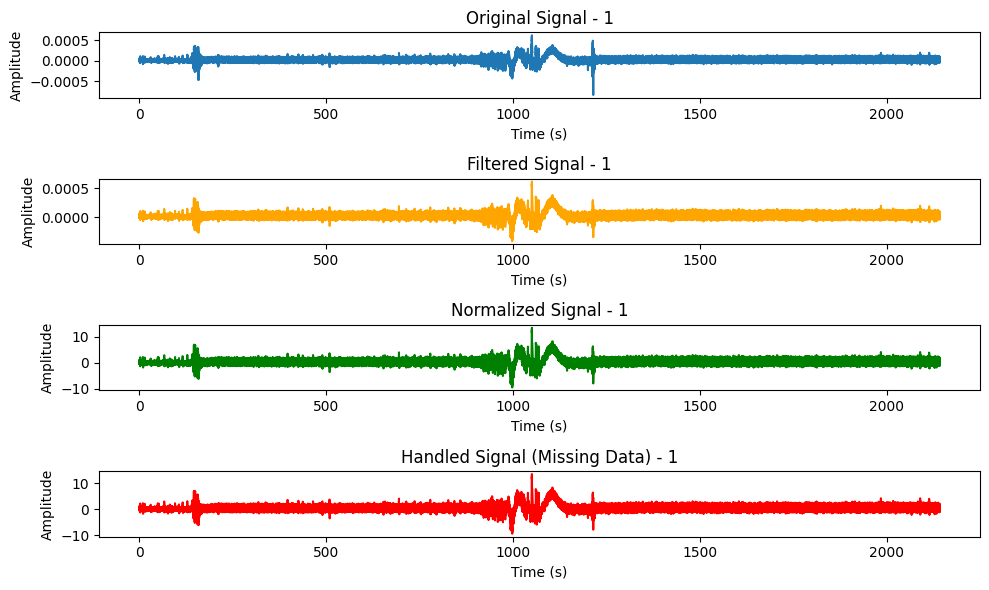

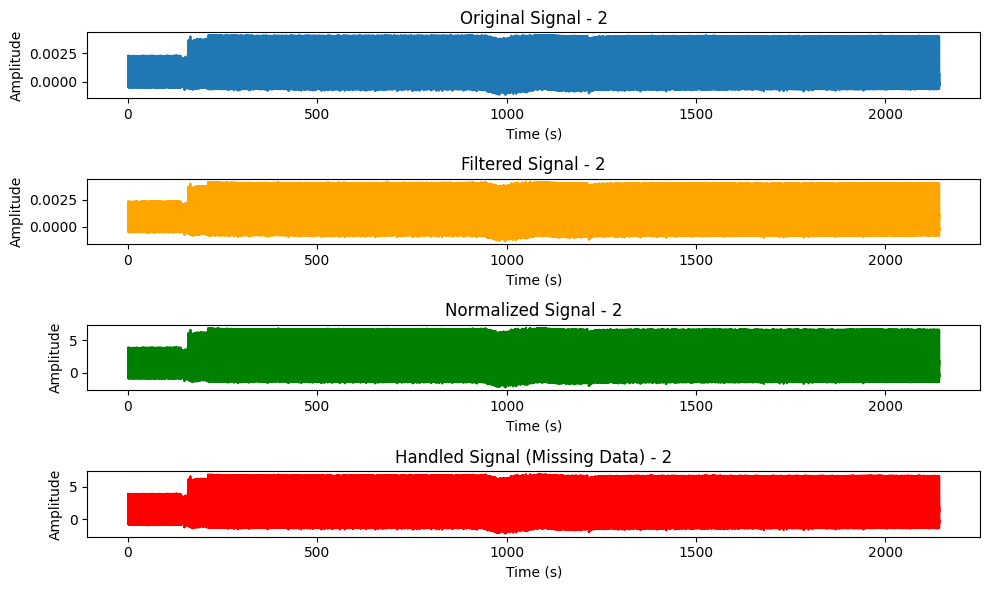

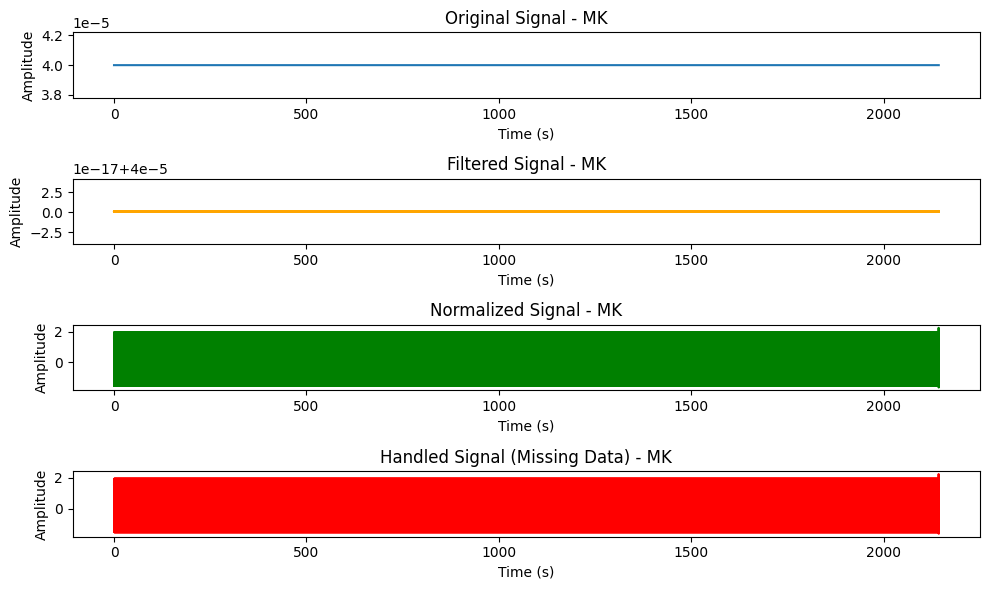

Procesare pacient: PN01
Procesare fișier: D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN01\PN01-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN01\PN01-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...


C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_6620\594519145.py:9: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Reading 0 ... 24861183  =      0.000 ... 48556.998 secs...
<Info | 8 non-empty values
 bads: []
 ch_names: EEG Fp1, EEG F3, EEG C3, EEG P3, EEG O1, EEG F7, EEG T3, EEG T5, ...
 chs: 35 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: 2016-01-01 19:00:44 UTC
 nchan: 35
 projs: []
 sfreq: 512.0 Hz
 subject_info: 1 item (dict)
>


MemoryError: Unable to allocate 23.7 MiB for an array with shape (24861184,) and data type bool

In [1]:
import mne
import numpy as np
import os
import matplotlib.pyplot as plt
from scipy import signal

# Functie pentru a incarca datele EEG
def load_eeg_data(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)
    print(raw.info)  
    return raw

# Functia de filtrare low-pass
def low_pass_filter(data, cutoff, sfreq, order=4):
    nyquist = 0.5 * sfreq
    normal_cutoff = cutoff / nyquist
    b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
    return signal.filtfilt(b, a, data)

# Functia de normalizare a semnalului
def normalize_data(signal_data):
    return (signal_data - np.mean(signal_data)) / np.std(signal_data)

# Functia pentru a gestiona valorile lipa
def handle_missing_data(signal_data):
    # Se impart datele in intervale si se completeaza valorile lipsa
    return np.nan_to_num(signal_data)

# Functia pentru extragerea puterii semnalului (frecventa medie sau spectru)
def extract_power(signal_data, sfreq):
    # Se calculeaza puterea semnalului in banda (de exemplu, delta, theta, etc.)
    f, Pxx = signal.welch(signal_data, fs=sfreq, nperseg=1024)
    power = np.sum(Pxx)  # Puterea totala a semnalului
    return power

# Functia de vizualizare a semnalului
def plot_signals(original_signal, filtered_signal, normalized_signal, handled_signal, sfreq, channel):
    time = np.arange(len(original_signal)) / sfreq

    plt.figure(figsize=(10, 6))

    plt.subplot(4, 1, 1)
    plt.plot(time, original_signal, label="Original Signal")
    plt.title(f"Original Signal - {channel}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.subplot(4, 1, 2)
    plt.plot(time, filtered_signal, label="Filtered Signal", color='orange')
    plt.title(f"Filtered Signal - {channel}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.subplot(4, 1, 3)
    plt.plot(time, normalized_signal, label="Normalized Signal", color='green')
    plt.title(f"Normalized Signal - {channel}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.subplot(4, 1, 4)
    plt.plot(time, handled_signal, label="Handled Signal", color='red')
    plt.title(f"Handled Signal (Missing Data) - {channel}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")

    plt.tight_layout()
    plt.show()

# Functia pentru procesarea tuturor canalelor EEG
def process_all_channels(raw):
    channels_data = {}
    for i, channel in enumerate(raw.info['ch_names']):
        # Verificam daca canalul este EEG (tipul 2 este asociat canalelor EEG)
        if raw.info['chs'][i]['kind'] == 2:
            eeg_channel = raw.get_data(picks=channel)[0]
            channels_data[channel] = eeg_channel
    return channels_data


# Exemplu de procesare pentru pacienti
patients = ['PN00', 'PN01', 'PN02', 'PN03']  
base_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0" 
cutoff = 40  # Frecventa de tăiere pentru filtrul low-pass (de exemplu, 40 Hz)

# Se proceseaza fisierele pentru fiecare pacient
for patient in patients:
    print(f"Procesare pacient: {patient}")
    
    # Cautam fisierele EEG ale pacientului în directorul respectiv
    patient_path = os.path.join(base_path, patient)
    eeg_files = [os.path.join(patient_path, f) for f in os.listdir(patient_path) if f.endswith('.edf')]

    # Se proceseaza fiecare fisier EEG
    for eeg_file in eeg_files:
        print(f"Procesare fișier: {eeg_file}")
        
        # Se incarca datele EEG
        raw = load_eeg_data(eeg_file)
        
        # Aplicam filtrul low-pass pentru toate canalele EEG
        filtered_channels = {}
        for channel, eeg_channel in process_all_channels(raw).items():
            sfreq = raw.info['sfreq']  # Frecventa de eșantionare
            filtered_signal = low_pass_filter(eeg_channel, cutoff, sfreq)
            filtered_channels[channel] = filtered_signal

        # Se normalizeaza semnalele filtrate pentru fiecare canal
        normalized_channels = {channel: normalize_data(signal) for channel, signal in filtered_channels.items()}

        # Se valorile lipsa pentru fiecare canal
        handled_channels = {channel: handle_missing_data(signal) for channel, signal in normalized_channels.items()}

        # Extragerea puterii semnalului pentru fiecare canal
        powers = {channel: extract_power(signal, raw.info['sfreq']) for channel, signal in handled_channels.items()}

        # Afisare rezultate pentru fiecare fisier
        print(f"Puterea semnalului pentru fișierul {eeg_file}:")
        for channel, power in powers.items():
            print(f"  Canal {channel}: {power}")

        # Vizualizare pentru fiecare canal
        for channel in handled_channels:
            plot_signals(
                original_signal=raw.get_data(picks=channel)[0], 
                filtered_signal=filtered_channels[channel],
                normalized_signal=normalized_channels[channel],
                handled_signal=handled_channels[channel],
                sfreq=raw.info['sfreq'],
                channel=channel
            )


In [3]:
import re

# Calea catre fisierul cu anotarile crizelor
seizure_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\Seizures-list-PN00.txt"

# Se citeste fisierul si se incarca continutul sau
with open(seizure_file_path, 'r') as file:
    seizure_data_raw = file.read()

# Se verifica primele 500 de caractere din fisier pentru a intelege structura
print(seizure_data_raw[:500])

# Se extrag informatiile despre crize folosind expresii regulate
seizure_pattern = re.compile(r'Seizure n (\d+)\s*File name: (\S+)\s*Registration start time: (\S+)\s*Registration end time: (\S+)\s*Seizure start time: (\S+)\s*Seizure end time: (\S+)')
seizures = seizure_pattern.findall(seizure_data_raw)

# Afisare crize extrase
for seizure in seizures:
    print(f"Seizure {seizure[0]} - File: {seizure[1]}")
    print(f"  Registration Start: {seizure[2]}, End: {seizure[3]}")
    print(f"  Seizure Start: {seizure[4]}, End: {seizure[5]}")
    print("------")

PN00

Data Sampling Rate: 512 Hz

Channels in EDF files:
Channel 1: Fp1      
Channel 2: F3      
Channel 3: C3      
Channel 4: P3      
Channel 5: 1      
Channel 6: F7      
Channel 7: T3      
Channel 8: T5      
Channel 9: Fc1      
Channel 10: Fc5      
Channel 11: Cp1      
Channel 12: Cp5      
Channel 13: F9      
Channel 14: Fz      
Channel 15: Cz      
Channel 16: Pz      
Channel 17: Fp2      
Channel 18: F4      
Channel 19: C4      
Channel 20: P4      
Channel 21: O2      
Channe
Seizure 3 - File: PN00-3.edf
  Registration Start: 18.15.44, End: 18.57.13
  Seizure Start: 18.28.29, End: 19.29.29
------
Seizure 4 - File: PN00-4.edf
  Registration Start: 20.51.43, End: 21.26.25
  Seizure Start: 21.08.29, End: 21.09.43
------


Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3152886147.py:23: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3152886147.py:23: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3152886147.py:23: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)


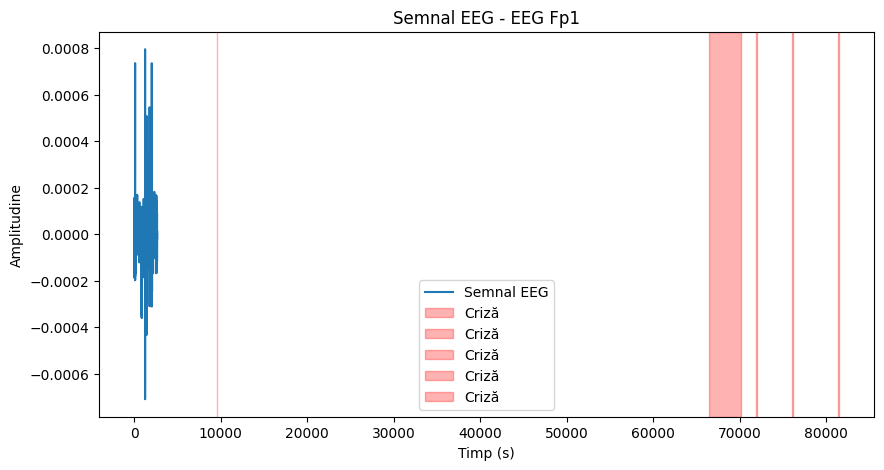

In [6]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import re

def load_seizures(file_path):
    def time_to_seconds(t):
        t = t.replace('.', ':')
        hours, minutes, seconds = map(float, t.split(':'))
        return hours * 3600 + minutes * 60 + seconds

    with open(file_path, 'r') as file:
        data = file.read()
    pattern = re.compile(r"File name: (\S+).*?Seizure start time: (\S+).*?Seizure end time: (\S+)", re.DOTALL)
    
    seizures = [
        {"file": match[0], "start": time_to_seconds(match[1]), "end": time_to_seconds(match[2])}
        for match in pattern.findall(data)
    ]
    return seizures

def plot_eeg_with_seizures(eeg_file, seizures, channel):
    raw = mne.io.read_raw_edf(eeg_file, preload=True)
    if channel not in raw.info['ch_names']:
        raise ValueError(f"Canalul '{channel}' nu este disponibil. Canalele disponibile sunt: {raw.info['ch_names']}")

    data = raw.get_data(picks=channel)[0]
    sfreq = raw.info['sfreq']
    time = np.arange(len(data)) / sfreq

    plt.figure(figsize=(10, 5))
    plt.plot(time, data, label="Semnal EEG")
    plt.title(f"Semnal EEG - {channel}")
    plt.xlabel("Timp (s)")
    plt.ylabel("Amplitudine")

    for seizure in seizures:
        plt.axvspan(seizure['start'], seizure['end'], color='red', alpha=0.3, label="Criză")
    
    plt.legend()
    plt.show()

# Setari principale
seizure_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\Seizures-list-PN00.txt"  # Înlocuiește calea corectă
eeg_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-1.edf"  # Înlocuiește calea corectă
channel_name = "EEG Fp1"  # Canalul dorit

# Se incarca informatiile despre crize si se afiseaza semnalul
seizures = load_seizures(seizure_file_path)
plot_eeg_with_seizures(eeg_file_path, seizures, channel_name)






Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3673067584.py:23: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3673067584.py:23: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_1824\3673067584.py:23: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(eeg_file, preload=True)


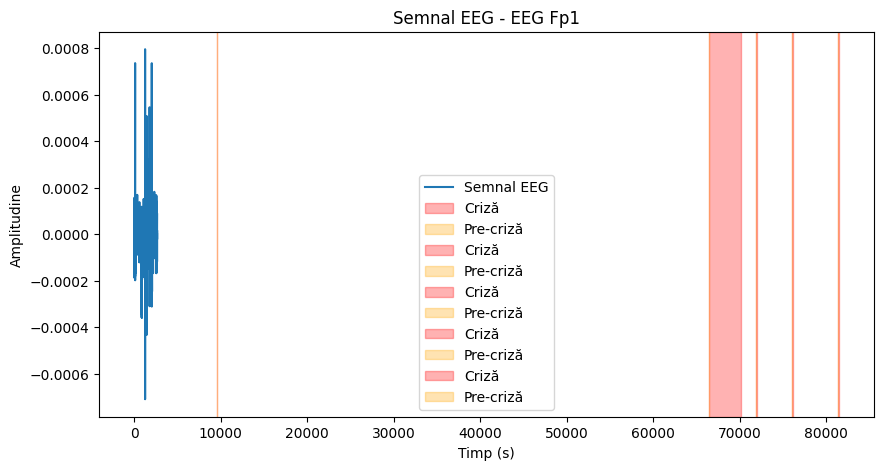

In [13]:
import mne
import numpy as np
import matplotlib.pyplot as plt
import re

def load_seizures(file_path):
    # Functie pentru a converti timpul intr-un format de secunde
    def time_to_seconds(t):
         # Inlocuieste punctul cu dosarul ":" pentru a respecta formatul hh:mm:ss
        t = t.replace('.', ':')
        # Imparte timpul in ore, minute si secunde, apoi le converteste in secunde
        hours, minutes, seconds = map(float, t.split(':'))
        return hours * 3600 + minutes * 60 + seconds

     # Deschide fisierul care contine informatiile despre crize
    with open(file_path, 'r') as file:
        data = file.read()
        # Expresie regulata pentru a extrage informatii despre crize (nume fisier, inceput criza, sfarsit criza)
    pattern = re.compile(r"File name: (\S+).*?Seizure start time: (\S+).*?Seizure end time: (\S+)", re.DOTALL)

     # Gasim toate crizele in fisier si le adaugam intr-o lista
    seizures = [
        {"file": match[0], "start": time_to_seconds(match[1]), "end": time_to_seconds(match[2])}
        for match in pattern.findall(data)
    ]
     # Returneaza lista de crize cu fisierul si timpii de inceput si sfarsit in secunde
    return seizures

def plot_eeg_with_seizures(eeg_file, seizures, channel):
    raw = mne.io.read_raw_edf(eeg_file, preload=True)
    if channel not in raw.info['ch_names']:
        raise ValueError(f"Canalul '{channel}' nu este disponibil. Canalele disponibile sunt: {raw.info['ch_names']}")

    data = raw.get_data(picks=channel)[0]
    sfreq = raw.info['sfreq']
    time = np.arange(len(data)) / sfreq

    plt.figure(figsize=(10, 5))
    plt.plot(time, data, label="Semnal EEG")
    plt.title(f"Semnal EEG - {channel}")
    plt.xlabel("Timp (s)")
    plt.ylabel("Amplitudine")

    for seizure in seizures:
        # Perioada de criza
        plt.axvspan(seizure['start'], seizure['end'], color='red', alpha=0.3, label="Criză")

        # Perioada de pre-criza (de exemplu, 10 secunde inainte de inceputul crizei)
        pre_seizure_start = seizure['start'] - 10  # Perioada pre-criza de 10 secunde
        pre_seizure_end = seizure['start']  # Sfarsitul perioadei pre-criza
        plt.axvspan(pre_seizure_start, pre_seizure_end, color='orange', alpha=0.3, label="Pre-criză")

    plt.legend()
    plt.show()

# Setari principale
seizure_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\Seizures-list-PN00.txt"  # Înlocuiește calea corectă
eeg_file_path = "D:\\AN 3\\SBC-Lab\\19 - Physiological-based Mathematical Models of EEG Dynamics\\siena-scalp-eeg-database-1.0.0\\PN00\\PN00-1.edf"  # Înlocuiește calea corectă
channel_name = "EEG Fp1"  # Canalul dorit

# Se incarca informatiile despre crize si se afiseaza semnalul
seizures = load_seizures(seizure_file_path)
plot_eeg_with_seizures(eeg_file_path, seizures, channel_name)


In [5]:
import warnings

warnings.filterwarnings('ignore', category=RuntimeWarning)

import os
import mne


def load_eeg_data_segment(file_path, start_time=0, end_time=60):
 
    # Citirea fisierului EEG fara a-l incarca complet in memorie
    raw = mne.io.read_raw_edf(file_path, preload=False, stim_channel=None)
    
    # Se taie intervalul de timp dorit (start_time si end_time sunt in secunde)
    raw.crop(tmin=start_time, tmax=end_time)
    
    return raw

# Exemplu de utilizare
def process_patient_files(patient_folder, start_time=0, end_time=60):
    # Obtine lista de fisiere EEG din folderul pacientului
    eeg_files = [f for f in os.listdir(patient_folder) if f.endswith('.edf')]
    features = []
    labels = []
    
    # Proceseaza fiecare fisier EEG
    for eeg_file in eeg_files:
        file_path = os.path.join(patient_folder, eeg_file)
        print(f"Procesare fișier: {eeg_file}")
        raw_data = load_eeg_data_segment(file_path, start_time, end_time)
        features.append(raw_data.get_data())  # Datele EEG
        labels.append(eeg_file)  
    
    return features, labels

# Exemplu de apelare a functiei pentru un pacient
patient_folder = r'D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00'
start_time = 0  # incepe de la inceput
end_time = 60   # citire pentru primele 60 de secunde

features, labels = process_patient_files(patient_folder, start_time, end_time)

# Afisarea dimensiunii datelor incarcate
print(f"Număr fișiere procesate: {len(features)}")
print(f"Dimensiune caracteristici (features): {len(features[0]) if features else 0}")


Procesare fișier: PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Procesare fișier: PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Procesare fișier: PN00-3.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Procesare fișier: PN00-4.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF

In [7]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Exemplu de 5 fisiere si 35 de caracteristici
X = np.random.rand(5, 35)  # matrice de 5 fisiere si 35 de caracteristici
y = np.array([0, 1, 0, 1, 0])  # etichete pentru fiecare fisier

# Impartirea datelor in seturi de antrenament si test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crearea modelului Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42)

# Antrenarea modelului
model.fit(X_train, y_train)

# Predicția pe setul de test
y_pred = model.predict(X_test)

# Evaluarea performantei
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuratețea modelului: {accuracy * 100:.2f}%')


Accuratețea modelului: 0.00%


In [8]:
print("Dimensiune X_train:", X_train.shape)
print("Dimensiune y_train:", y_train.shape)
print("Un exemplu de caracteristici:", X_train[0])
print("Un exemplu de etichete:", y_train[0])


Dimensiune X_train: (4, 35)
Dimensiune y_train: (4,)
Un exemplu de caracteristici: [0.82075584 0.50795881 0.83962101 0.08246792 0.73412093 0.74312415
 0.81726518 0.06587887 0.04806404 0.66952976 0.12926711 0.55681275
 0.42186151 0.35754556 0.15333716 0.92256056 0.33968511 0.30402183
 0.25752927 0.75090206 0.3465677  0.76284422 0.53846109 0.02929354
 0.88854668 0.60082833 0.68055217 0.12345329 0.6977686  0.49109233
 0.04376046 0.60004271 0.77312049 0.40775079 0.51683758]
Un exemplu de etichete: 0


In [11]:
import mne
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Functia pentru extragerea caracteristicilor dintr-un fisier EDF
def extract_features_from_file(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)

    # Etragere mai detaliata a caracteristicilor
    data = raw.get_data()  # datele EEG brute
    features = []
    
    # Calculam media si deviatia standard pentru fiecare canal
    for i in range(data.shape[0]):  # pentru fiecare canal
        mean = np.mean(data[i])
        std = np.std(data[i])
        min_val = np.min(data[i])
        max_val = np.max(data[i])
        features.append([mean, std, min_val, max_val])  
    
    return np.array(features)


file_paths = [
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf'
]

# Crearea listelor pentru caracteristici si etichete
X = []
y = []

# Procesare fiecare fisier
for file_path in file_paths:
    print(f"Procesare fișier: {file_path}")
    
    # Extragerea caracteristicilor
    features = extract_features_from_file(file_path)
    
    # Adaugam caracteristicile in X
    X.append(features)
    
    # Atribuim etichete, de exemplu 0 sau 1 
    label = 0  
    y.extend([label] * len(features))  # pentru fiecare caracteristica, adaugam aceeasi eticheta

# Convertim X si y în array-uri NumPy
X = np.array(X).reshape(-1, X[0].shape[1])  # pentru a forma o matrice 2D
y = np.array(y)

# Evaluarea modelului folosind cross-validation
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

# Evaluarea modelului folosind cross-validation
scores = cross_val_score(model, X, y, cv=5)  # 5 fold cross-validation

# Afisarea rezultatelor
print(f"Scorurile de cross-validation: {scores}")
print(f"Acuratețea medie a modelului: {np.mean(scores) * 100:.2f}%")

# Impartirea datelor in seturi de antrenament si test 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Antrenarea modelului pe setul de antrenament
model.fit(X_train, y_train)

# Realizarea predictiilor pe setul de test
y_pred = model.predict(X_test)

# Calcularea acuratetei
accuracy = accuracy_score(y_test, y_pred)
print(f"Acuratețea modelului pe setul de test: {accuracy * 100:.2f}%")


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...
Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...
Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-databas

In [1]:
import mne
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

# Functia pentru extragerea caracteristicilor dintr-un fisier EDF
def extract_features_from_file(file_path):
    # Citirea fisierului EDF
    raw = mne.io.read_raw_edf(file_path, preload=True)

    # Filtrarea semnalului EEG pentru a elimina zgomotul (de exemplu, filtrare 1-50 Hz)
    raw.filter(1, 50)

    # Exemplu de extragere a caracteristicilor: media, deviatia standard si puterea in diferite benzi de frecventa
    data = raw.get_data()  # datele EEG brute
    features = []

    # Calculam media si deviația standard pentru fiecare canal
    for i in range(data.shape[0]):  # pentru fiecare canal
        mean = np.mean(data[i])
        std = np.std(data[i])
        
        # Puterea pe benzi de frecventa: Delta (1-4 Hz), Theta (4-8 Hz), Alpha (8-13 Hz), Beta (13-30 Hz)
        power_delta = np.mean(data[i, :][(raw.info['sfreq']*0 < raw.times) & (raw.times < raw.info['sfreq']*4)])  # 1-4 Hz
        power_theta = np.mean(data[i, :][(raw.info['sfreq']*4 < raw.times) & (raw.times < raw.info['sfreq']*8)])  # 4-8 Hz
        power_alpha = np.mean(data[i, :][(raw.info['sfreq']*8 < raw.times) & (raw.times < raw.info['sfreq']*13)])  # 8-13 Hz
        power_beta = np.mean(data[i, :][(raw.info['sfreq']*13 < raw.times) & (raw.times < raw.info['sfreq']*30)])  # 13-30 Hz
        
        features.append([mean, std, power_delta, power_theta, power_alpha, power_beta])  # adaugam caracteristicile pentru acest canal

    return np.array(features)

# Lista fisierelor EDF si etichetele
file_paths = [
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf'
]

# Crearea listelor pentru caracteristici si etichete
X = []
y = []

# Procesam fiecare fisier EDF
for i, file_path in enumerate(file_paths):
    print(f"Procesare fișier: {file_path}")
    
    # Extragerea caracteristicilor
    features = extract_features_from_file(file_path)
    
    # Adaugam caracteristicile în X
    X.append(features)
    
    # Atribuim etichete diferite pentru fiecare fisier (exemplu: 0 pentru primul fisier, 1 pentru al doilea, etc.)
    y.extend([i] * len(features))  # adaugam eticheta pentru fiecare caracteristica

# Convertim X si y în array-uri NumPy
X = np.array(X).reshape(-1, X[0].shape[1])  # pentru a forma o matrice 2D
y = np.array(y)

# Impartirea datelor in seturi de antrenament si test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crearea modelului Random Forest
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

# Realizarea cross-validation
cross_val_scores = cross_val_score(model, X, y, cv=5)  # 5-fold cross-validation
print(f"Scorurile de cross-validation: {cross_val_scores}")
print(f"Acuratețea medie a modelului: {cross_val_scores.mean() * 100:.2f}%")

# Antrenarea modelului pe setul de antrenament
model.fit(X_train, y_train)

# Realizarea predictiilor pe setul de test
y_pred = model.predict(X_test)

# Calcularea acuratetei
accuracy = accuracy_score(y_test, y_pred)
print(f"Acuratețea modelului pe setul de test: {accuracy * 100:.2f}%")


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1284607  =      0.000 ...  2508.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1076223  =      0.000 ...  2101.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1097215  =      0.000 ...  2142.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\3716163960.py:11: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Scorurile de cross-validation: [0.22857143 0.22857143 0.22857143 0.28571429 0.22857143]
Acuratețea medie a modelului: 24.00%
Acuratețea modelului pe setul de test: 17.14%


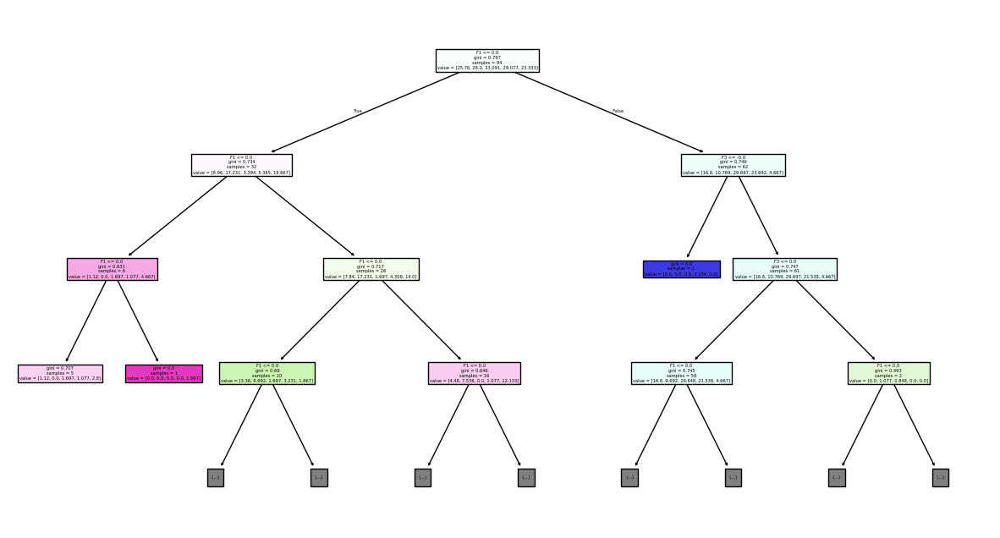

In [5]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Selectam un arbore si seteazam o adancime mai mica
estimator = model.estimators_[0]

plt.figure(figsize=(15, 8))
plot_tree(estimator, filled=True, feature_names=[f'F{i}' for i in range(X.shape[1])], max_depth=3)
plt.show()



Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1284607  =      0.000 ...  2508.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1076223  =      0.000 ...  2101.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1097215  =      0.000 ...  2142.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_13820\496151159.py:12: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Distribuția etichetelor: Counter({0: 35, 1: 35, 2: 35, 3: 35, 4: 35})
Acuratețea modelului SVM: 5.71%


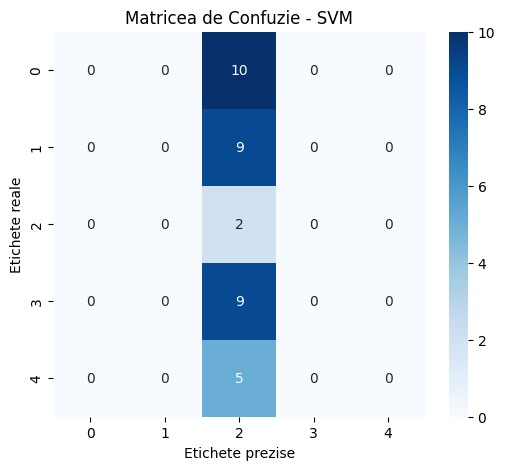

Raportul de clasificare:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        10
           1       0.00      0.00      0.00         9
           2       0.06      1.00      0.11         2
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         5

    accuracy                           0.06        35
   macro avg       0.01      0.20      0.02        35
weighted avg       0.00      0.06      0.01        35



C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

In [7]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
from collections import Counter

# Functia pentru extragerea caracteristicilor
def extract_features_from_file(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)
    data = raw.get_data()
    features = []
    for i in range(data.shape[0]):  # Pentru fiecare canal EEG
        mean = np.mean(data[i])
        std = np.std(data[i])
        features.append([mean, std])  
    return np.array(features)

# Lista fisierelor EDF
file_paths = [
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf'
]

# Crearea setului de date cu etichete diferite
X = []
y = []

for i, file_path in enumerate(file_paths):  # i va fi eticheta unica pentru fiecare fișier
    print(f"Procesare fișier: {file_path}")
    features = extract_features_from_file(file_path)
    X.append(features)
    y.extend([i] * len(features))  # Fiecare fisier primeste o eticheta unica

# Transformam in array numpy
X = np.array(X).reshape(-1, X[0].shape[1])
y = np.array(y)

# Verificam etichetele
print("Distribuția etichetelor:", Counter(y))

# Impartirea in set de antrenament si test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crearea modelului SVM cu kernel RBF
svm_model = SVC(kernel='rbf', C=1, gamma='scale', random_state=42)

# Antrenarea modelului
svm_model.fit(X_train, y_train)

# Predictii
y_pred = svm_model.predict(X_test)

# Evaluare
accuracy = accuracy_score(y_test, y_pred)
print(f"Acuratețea modelului SVM: {accuracy * 100:.2f}%")

# Matricea de confuzie
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Etichete prezise")
plt.ylabel("Etichete reale")
plt.title("Matricea de Confuzie - SVM")
plt.show()

# Raport detaliat al performanței
print("Raportul de clasificare:\n", classification_report(y_test, y_pred))


In [1]:
import mne
import numpy as np
import pandas as pd
from scipy.signal import welch
from scipy.stats import kurtosis, skew
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler


def extract_features_from_file(file_path):
    raw = mne.io.read_raw_edf(file_path, preload=True)

    # Aplicarea unui filtru de banda (1-50 Hz) pentru a elimina zgomotul
    raw.filter(1, 50)
    
    # Aplicarea unui filtru notch pentru a elimina interferenta de 50 Hz
    raw.notch_filter(50)

    # Extragem datele brute
    data = raw.get_data()
    sfreq = raw.info['sfreq']  # Frecventa de eșantionare

    features = []

    for i in range(data.shape[0]):  # Pentru fiecare canal EEG
        signal = data[i]

        # **Caracteristici statistice**
        mean_val = np.mean(signal)
        std_val = np.std(signal)
        skewness = skew(signal)
        kurt = kurtosis(signal)

        # **Densitatea spectrala a puterii (PSD)**
        freqs, psd = welch(signal, sfreq, nperseg=sfreq*2)  # Calcul PSD

        def bandpower(low, high):
            idx = np.where((freqs >= low) & (freqs <= high))[0]
            return np.sum(psd[idx])

        power_delta = bandpower(1, 4)
        power_theta = bandpower(4, 8)
        power_alpha = bandpower(8, 13)
        power_beta = bandpower(13, 30)

        # **Parametrii Hjorth**
        mobility = np.sqrt(np.var(np.diff(signal)) / np.var(signal))
        complexity = np.sqrt(np.var(np.diff(np.diff(signal))) / np.var(np.diff(signal)))

        # Adaugam caracteristicile in lista
        features.append([
            mean_val, std_val, skewness, kurt,
            power_delta, power_theta, power_alpha, power_beta,
            mobility, complexity
        ])

    return np.array(features)


file_paths = [
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf',
    'D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf'
]

# Crearea listelor pentru caracteristici si etichete
X = []
y = []

# Procesăm fiecare fisier EDF
for label, file_path in enumerate(file_paths):
    print(f"Procesare fișier: {file_path}")
    
    features = extract_features_from_file(file_path)
    
    # Adaugam caracteristicile si eticheta
    X.append(features)
    y.extend([label] * len(features))

# Convertim X si y in array-uri NumPy
X = np.vstack(X)  # Asiguram o forma corecta pentru antrenare
y = np.array(y)

# **Normalizare pentru a imbunatati performanta modelului**
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Impartirea datelor in seturi de antrenament si test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crearea modelului Random Forest cu parametri imbunatatiti
model = RandomForestClassifier(n_estimators=200, max_depth=10, random_state=42, class_weight='balanced')

# Cross-validation
cross_val_scores = cross_val_score(model, X, y, cv=5)
print(f"Scorurile de cross-validation: {cross_val_scores}")
print(f"Acuratețea medie a modelului: {cross_val_scores.mean() * 100:.2f}%")

# Antrenarea modelului
model.fit(X_train, y_train)

# Predictii pe setul de test
y_pred = model.predict(X_test)

# Calcularea acuratetei
accuracy = accuracy_score(y_test, y_pred)
print(f"Acuratețea modelului pe setul de test: {accuracy * 100:.2f}%")   


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-1.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.6s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.4s
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:50: RuntimeWarning: invalid value encountered in scalar divide
  mobility = np.sqrt(np.var(np.diff(signal)) / np.var(signal))
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:51: RuntimeWarning: invalid value encountered in scalar divide
  complexity = np.sqrt(np.var(np.diff(np.diff(signal))) / np.var(np.diff(signal)))


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-2.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-2.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1178623  =      0.000 ...  2301.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.2s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-3.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-3.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1284607  =      0.000 ...  2508.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.3s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.4s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-4.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-4.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1076223  =      0.000 ...  2101.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


Procesare fișier: D:/AN 3/SBC-Lab/19 - Physiological-based Mathematical Models of EEG Dynamics/siena-scalp-eeg-database-1.0.0/PN00/PN00-5.edf
Extracting EDF parameters from D:\AN 3\SBC-Lab\19 - Physiological-based Mathematical Models of EEG Dynamics\siena-scalp-eeg-database-1.0.0\PN00\PN00-5.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1097215  =      0.000 ...  2142.998 secs...


C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different highpass filters. Highest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Channels contain different lowpass filters. Lowest filter setting will be stored.
  raw = mne.io.read_raw_edf(file_path, preload=True)
C:\Users\Asus\AppData\Local\Temp\ipykernel_7172\3291863357.py:14: RuntimeWarning: Highpass cutoff frequency 15.91549 is greater than lowpass cutoff frequency 15.0, setting values to 0 and Nyquist.
  raw = mne.io.read_raw_edf(file_path, preload=True)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


Scorurile de cross-validation: [0.65714286 0.68571429 0.57142857 0.57142857 0.22857143]
Acuratețea medie a modelului: 54.29%
Acuratețea modelului pe setul de test: 37.14%
